# Results for checkpoints from the 7.5B multiling model.
This notebook reads results produced by the collect_results.py script. The collect_results.py script aggregates results from multiple directories. You can view and manipulate the aggregated results to get insights from the data.

In [1]:
from IPython.lib.deepreload import reload
%load_ext autoreload
%autoreload 2

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

import logging
import matplotlib
matplotlib._log.disabled = True
logging.basicConfig(level='CRITICAL')
# Turn off sina logging
for name in [
             "matplotlib", "matplotlib.font", "matplotlib.pyplot"]:
    logger = logging.getLogger(name)
    logger.setLevel(logging.CRITICAL)
    logger.disabled = True
    
import glob
import os
import json
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from matplotlib.colors import LinearSegmentedColormap
cmap_green_yellow_red = LinearSegmentedColormap.from_list(
    name='test', 
    colors=['green','yellow','red']
)


from scipy import stats
import time

import pandas as pd
from pandas import DataFrame

import sys
# add reference to the few_shot dir
path_base = os.path.abspath(os.path.join(sys.path[0], '../'))
print(path_base)
sys.path.insert(1, path_base)
from collect_results import view_preferred_metrics, get_first_candidates_prompts, get_first_pred_prompts_example

/private/home/tbmihaylov/fairseq-xlmg/examples/few_shot


# Estimating the significance of results using proportion test
Shuohui has implemented a function for power analysis using proportion significance test. It estimates if two systems have significantly different results with an assumed statistical power and significance level and number of tested examples.. 
This article is useful to understand the concepts: https://machinelearningmastery.com/statistical-power-and-power-analysis-in-python/. 

My noob understanding is:

Power analysis aims at evaluating if/how a given hypothesis can be used to draw conclusions. In our case the hypothesis is that the result of System A is better of System B. Important parameters are:
- Statistical power: the probability of being able to draw conclusions if such conclusion can be taken. Higher is better and it is usually selected > 0.80 (80%).
- Significance level: the maximum acceptable probability of rejecting the current hypothesis. It is usually selected <=0.05 (5%).
- Sample size (N1 and N2): The number of observations in the evaluated sample. In our case this is the number of examples used to calculate the probabilities for our observations. 
- Probabilities for A (P1) and B (P2): We use probabilities the performance of systems A and B. 
A power analysis can estimate each of the parameters given all other parameters.

In our experiments we will compute either statistical power or significance level given the size of the eval set (n1=n2) and the performance of system A and B (p1 and p2). Here is an example:

Having accuracy for system A P1=0.75 and accuracy for B P2=0.72 for model setups evaluated on a set with size=1000, we assume that the min stat_power=0.8 and we want to compute what is the significance level -- what is the chance rejecting the hypothesis of System A being better than System B. 


In [2]:
from examples.few_shot.scripts.significance_test import ProportionSignificanceTest
n_demo = 1000
max_sig_level = 0.05
min_stat_power = 0.80

p1_demo=0.75
p2_demo=0.71

sig_level = ProportionSignificanceTest().solve(
    n1=n_demo, n2=n_demo , p1=p1_demo, p2=p2_demo, power=min_stat_power, sig_level=None
)
print(f"Given p1={p1_demo}, p2={p2_demo}, sample size={n_demo} and min stat_power={min_stat_power}:")
print(f"We estimate that the curr significance={sig_level[0]}, which is {'worse' if sig_level[0]>max_sig_level else 'better'} than max_sig_level={max_sig_level}, so we {'reject' if sig_level[0]>max_sig_level else 'accept'} the hypothesis given the constraints.")

def st_get_sigrange(p, n):
    """Returns the range for referent significant values"""
    
    pp = p if p < 1.0 else float(p)/100.0
    pdown = ProportionSignificanceTest().solve(n1=n, n2=n, p1=pp, p2=None, power=min_stat_power, sig_level=max_sig_level)
    pup = ProportionSignificanceTest().solve(n1=n, n2=n, p1=None, p2=pp, power=min_stat_power, sig_level=max_sig_level)
    if p > 1.0:
        pdown=pdown*100
        pup=pup*100
    pdown = p - pdown
    pup = pup - p
        
    return (pup, pdown)


st_get_sigrange(p=56, n=100)

Given p1=0.75, p2=0.71, sample size=1000 and min stat_power=0.8:
We estimate that the curr significance=0.2392808972973926, which is worse than max_sig_level=0.05, so we reject the hypothesis given the constraints.


(18.691702283026558, 19.621309284633256)

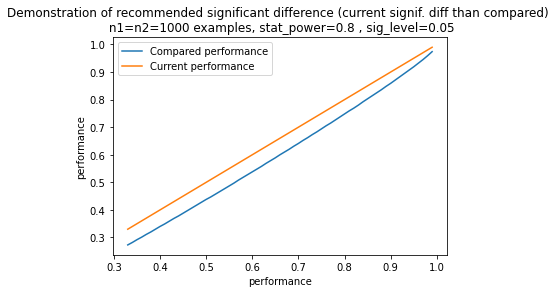

Demonstration of recommended significant difference (current signif. diff than compared) 
 n1=n2=1000 examples, stat_power=0.8 , sig_level=0.05

 How to read: if we have performance of the current system ('current perforamnce') the system that we compare to need to have performance smaller than the corresponding 'compared performance'.

Actual values (curr, compared): [(0.33, 0.273), (0.34, 0.282), (0.35, 0.292), (0.36, 0.301), (0.37, 0.311), (0.38, 0.32), (0.39, 0.33), (0.4, 0.34), (0.41, 0.349), (0.42, 0.359), (0.43, 0.369), (0.44, 0.378), (0.45, 0.388), (0.46, 0.398), (0.47, 0.408), (0.48, 0.418), (0.49, 0.428), (0.5, 0.438), (0.51, 0.447), (0.52, 0.457), (0.53, 0.467), (0.54, 0.477), (0.55, 0.487), (0.56, 0.497), (0.57, 0.508), (0.58, 0.518), (0.59, 0.528), (0.6, 0.538), (0.61, 0.548), (0.62, 0.558), (0.63, 0.569), (0.64, 0.579), (0.65, 0.589), (0.66, 0.6), (0.67, 0.61), (0.68, 0.62), (0.69, 0.631), (0.7, 0.641), (0.71, 0.652), (0.72, 0.662), (0.73, 0.673), (0.74, 0.683), (0.75, 0.

In [3]:
# Show how the comparison looks like. 
a = [(i/100, np.round(ProportionSignificanceTest().solve(
            n1=n_demo, n2=n_demo , p1=i/100.0, p2=None, power=min_stat_power, sig_level=max_sig_level
),3)) for i in range(33, 100)]

x,y = zip(*a)
plt.plot(x, y, label='Compared performance')
plt.plot(x, x, label='Current performance')
plt.xlabel("performance")
plt.ylabel("performance")
plt.legend()
demo_title = f"Demonstration of recommended significant difference (current signif. diff than compared) \n n1=n2={n_demo} examples, stat_power={min_stat_power} , sig_level={max_sig_level}"
plt.title(demo_title)

plt.show()
print(demo_title)
print("\n How to read: if we have performance of the current system ('current perforamnce') the system that we compare to need to have performance smaller than the corresponding 'compared performance'." )
print()
print(f"Actual values (curr, compared):",a)


# Read the raw results file
Set the results_json below to your results.tsv.raw.jsonl file.

In [4]:
# This is the path to the raw results file generated with the script
results_json = "/private/home/tbmihaylov/fairseq-xlmg/gpt3_repro_cb_results.tsv.raw.jsonl"
results_json = "/private/home/tbmihaylov/fairseq-xlmg/cb_our_models.tsv.raw.jsonl"
#results_json = "/checkpoint/tbmihaylov/few_shot/xnli_experimental/results_200.tsv.raw.jsonl"

# python examples/few_shot/scripts/collect_results.py -i /checkpoint/tbmihaylov/few_shot/xnli_experimental/*smpl.All* -o /checkpoint/tbmihaylov/few_shot/xnli_experimental/results.tsv -v preferred_metrics_mean
results_json = "/checkpoint/tbmihaylov/few_shot/xnli_experimental/results.tsv.raw.jsonl"

#python examples/few_shot/scripts/collect_results.py -i /checkpoint/tbmihaylov/few_shot/2021_09_multilingual_eval_v1 -o /checkpoint/tbmihaylov/few_shot/2021_09_multilingual_eval_v1/results.tsv -v preferred_metrics_mean
results_json = "/checkpoint/tbmihaylov/few_shot/multilingual_xnli_1.3B_gpt3_setting_checkpoints/results.tsv.raw.jsonl"
# python examples/few_shot/scripts/collect_results.py -i /checkpoint/tbmihaylov/few_shot/2021_09_multilingual_eval_v1_full -o /checkpoint/tbmihaylov/few_shot/2021_09_multilingual_eval_v1_full/results.tsv -v preferred_metrics_mean
#results_json = "/checkpoint/tbmihaylov/few_shot/2021_09_multilingual_eval_v1_full/results.tsv.raw.jsonl"
#results_json = "/checkpoint/tbmihaylov/few_shot/2021_09_multilingual_eval_v1_full_calib/results.tsv.raw.jsonl"

# use the following script to recompute the results
# python examples/few_shot/scripts/collect_results.py -i /checkpoint/tbmihaylov/few_shot/2021-09-15-multilingual_bigrun_eval_v1_extended -o /checkpoint/tbmihaylov/few_shot/2021-09-15-multilingual_bigrun_eval_v1_extended/results.tsv -r 
results_json = "/checkpoint/tbmihaylov/few_shot/2021-09-15-multilingual_bigrun_eval_v1_extended/results.tsv.raw.jsonl"

# python examples/few_shot/scripts/collect_results.py -i /large_experiments/xlmg/results/multilingual/dense_7_5B_30lang_cpts/ -o /large_experiments/xlmg/results/multilingual/dense_7_5B_30lang_cpts/results.tsv -r 
results_json = "/large_experiments/xlmg/results/multilingual/dense_7_5B_30lang_cpts/results.tsv.raw.jsonl"


results_json = ["/large_experiments/xlmg/results/multilingual/dense_7_5B_30lang_cpts/results.tsv.raw.jsonl",
                "/private/home/tbmihaylov/fairseq-xlmg/_results/2021-10-06-results/results.tsv.raw.jsonl",
                #"/private/home/tbmihaylov/fairseq-xlmg/_results/2021-07-06-ppl-eval-results-dense-and-moe-r.tsv.raw.jsonl"
               ]

In [5]:
output_results_file_prefix = "/private/home/tbmihaylov/fairseq-xlmg/_results/2021-10-06-all-results.tsv"

In [6]:
only_monolingual = False 

if not isinstance(results_json, list):
    results_json = [results_json]

results = []

for res_json_file in results_json:
    with open(res_json_file) as f_res:
        for line in f_res:
            line = line.strip()
            item = json.loads(line)
            if 'run_params::n_eval_samples' not in item:
                item['run_params::n_eval_samples'] = 0
            if item['run_params::n_eval_samples'] != 0:
                continue

            item['eval_examples_cnt'] = int(item.get('eval_examples_cnt::mean', item['run_params::n_eval_samples']))

            for k in list(item.keys()):
                if k.startswith("ppl_candidates_full_prompt__"):
                    del item[k]

            if only_monolingual and item["train_lang"] != item["language"]:
                continue
            results.append(item)

print(f"{len(results)} items loaded")
#print(item)

1510 items loaded


In [7]:
df = DataFrame.from_records(results)

In [8]:
print("The results have the following columns:")
columns = list(df.columns)

#columns
acc_cols = [x for x in columns if x.startswith("accuracy") and (x.endswith("mean") or "ensemble" in x)]
acc_cols
#print(acc_cols)



The results have the following columns:


['accuracy::mean',
 'accuracy_sum::mean',
 'accuracy_mean_full::mean',
 'accuracy_mean::mean',
 'accuracy_sum_charnorm::mean',
 'accuracy__raw::mean',
 'accuracy_run::mean',
 'accuracy_sum_calib::mean',
 'accuracy_mean_full_calib::mean',
 'accuracy_mean_calib::mean',
 'accuracy_sum_charnorm_calib::mean']

## Print verbalized prompts for multiple settings
Once you have the results for different task templates you will want to see what the templates look like. 

In [9]:
print("Verbalized examples:")
print("#" * 10)
for item in results:
    verbalized_prompt = get_first_pred_prompts_example(item["results_file"])
    verablization_info = f"task:{item['task']} nshot={item['nb_few_shot_samples']} template lang:{item['language']}: {item['template']}:\n{verbalized_prompt} "
    item["verbalization"] = verablization_info
    if item["language"] == "en" or item["language"] == "es":
        print(verablization_info)
        print("")
        

Verbalized examples:
##########
task:storycloze nshot=0 template lang:en: storycloze:
### Prompt for cand `He is happy now.`:
Rick grew up in a troubled household. He never found good support in family, and turned to gangs. It wasn't long before Rick got shot in a robbery. The incident caused him to turn a new leaf. He is happy now.
########## 

task:storycloze nshot=0 template lang:es: storycloze:
### Prompt for cand `Ahora está feliz.`:
Ricky creció en un hogar conflictivo. Nunca encontró apoyo en su familia y recurrió a las pandillas. No pasó mucho tiempo antes de que Ricky fuera disparado en un robo. El incidente le hizo pasar página. Ahora está feliz.
########## 

task:pawsx nshot=0 template lang:en: pawsx_mt:
### Prompt for cand `true`:
Sentence 1: From the merger of the Four Rivers Council and the Audubon Council, the Shawnee Trails Council was born. Sentence 2: Shawnee Trails Council was formed from the merger of the Four Rivers Council and the Audubon Council. Sentence 1 and S

task:xnli nshot=0 template lang:en: xnli_generativenli_ht:
### Prompt for cand `entailment`:
And he said, Mama, I'm home, right? Yes, he called his mom as soon as the school bus dropped him off.
##########
### Calibrations prompts for cand `entailment`:
## calib option 0 prompt:
Yes, he called his mom as soon as the school bus dropped him off. 

task:xnli nshot=0 template lang:es: xnli_generativenli_ht:
### Prompt for cand `entailment`:
Y él dijo: Mamá, estoy en casa, ¿verdad? Sí, llamó a su madre tan pronto como el autobús escolar lo dejó.
##########
### Calibrations prompts for cand `entailment`:
## calib option 0 prompt:
Sí, llamó a su madre tan pronto como el autobús escolar lo dejó. 

task:xnli nshot=0 template lang:en: xnli_generativenli_sentence__en:
### Prompt for cand `entailment`:
And he said, Mama, I'm home.. Right? Yes, he called his mom as soon as the school bus dropped him off.
##########
### Calibrations prompts for cand `entailment`:
## calib option 0 prompt:
Yes, he ca

task:xnli nshot=0 template lang:en: xnli_generativenli__en:
### Prompt for cand `entailment`:
And he said, Mama, I'm home, right? Yes, he called his mom as soon as the school bus dropped him off.
##########
### Calibrations prompts for cand `entailment`:
## calib option 0 prompt:
Yes, he called his mom as soon as the school bus dropped him off. 

task:xnli nshot=0 template lang:es: xnli_generativenli__en:
### Prompt for cand `entailment`:
Y él dijo: Mamá, estoy en casa, right? Yes, llamó a su madre tan pronto como el autobús escolar lo dejó.
##########
### Calibrations prompts for cand `entailment`:
## calib option 0 prompt:
Yes, llamó a su madre tan pronto como el autobús escolar lo dejó. 

task:xwinograd nshot=0 template lang:en: winograd:
### Prompt for cand `The city councilmen`:
The city councilmen refused the demonstrators a permit because The city councilmen feared violence.
########## 

task:storycloze nshot=0 template lang:en: storycloze:
### Prompt for cand `He is happy now.`

task:xnli nshot=0 template lang:en: xnli_generativenli__en:
### Prompt for cand `entailment`:
And he said, Mama, I'm home, right? Yes, he called his mom as soon as the school bus dropped him off.
##########
### Calibrations prompts for cand `entailment`:
## calib option 0 prompt:
Yes, he called his mom as soon as the school bus dropped him off. 

task:xnli nshot=0 template lang:es: xnli_generativenli__en:
### Prompt for cand `entailment`:
Y él dijo: Mamá, estoy en casa, right? Yes, llamó a su madre tan pronto como el autobús escolar lo dejó.
##########
### Calibrations prompts for cand `entailment`:
## calib option 0 prompt:
Yes, llamó a su madre tan pronto como el autobús escolar lo dejó. 

task:xwinograd nshot=0 template lang:en: winograd:
### Prompt for cand `The city councilmen`:
The city councilmen refused the demonstrators a permit because The city councilmen feared violence.
########## 

task:arcchallenge nshot=0 template lang:en: arc_old:
### Prompt for cand `A`:
Juan and LaKei

task:winogrande nshot=0 template lang:en: winogrande:
### Prompt for cand `Sarah`:
Sarah was a much better surgeon than Maria so Sarah always got the easier cases.
########## 

task:arcchallenge nshot=0 template lang:en: arc_old:
### Prompt for cand `A`:
Juan and LaKeisha roll a few objects down a ramp. They want to see which object rolls the farthest. What should they do so they can repeat their investigation? It is put the objects in groups.
##########
### Calibrations prompts for cand `A`:
## calib option 0 prompt:
It is put the objects in groups. 

task:arceasy nshot=0 template lang:en: arc_old:
### Prompt for cand `A`:
Which technology was developed most recently? It is cellular telephone.
########## 

task:blimp__adjunct_island nshot=0 template lang:en: blimp:
### Prompt for cand `sentence_good`:
Who should Derek hug after shocking Richard?
########## 

task:blimp__anaphor_gender_agreement nshot=0 template lang:en: blimp:
### Prompt for cand `sentence_good`:
Katherine can't help 

task:xnli nshot=0 template lang:en: xnli_generativenli__en:
### Prompt for cand `entailment`:
And he said, Mama, I'm home, right? Yes, he called his mom as soon as the school bus dropped him off.
########## 

task:xnli nshot=0 template lang:es: xnli_generativenli__en:
### Prompt for cand `entailment`:
Y él dijo: Mamá, estoy en casa, right? Yes, llamó a su madre tan pronto como el autobús escolar lo dejó.
########## 

task:pawsx nshot=0 template lang:en: pawsx_generativenli__en:
### Prompt for cand `true`:
From the merger of the Four Rivers Council and the Audubon Council, the Shawnee Trails Council was born., right? Yes, Shawnee Trails Council was formed from the merger of the Four Rivers Council and the Audubon Council.
########## 

task:pawsx nshot=0 template lang:es: pawsx_generativenli__en:
### Prompt for cand `true`:
El Consejo Shawnee Trail nació de la unión entre el Consejo Four Rivers y el Consejo Audubon., right? Yes, El Consejo de caminos de los Shawnee se formó por la fusión

# Aggregated custom view using pandas
You can use the pandas api to manipulate the table and create custom views. 

In [10]:
def view_preferred_metrics_mean(df):
    run_columns = ["task", "eval_set", "eval_examples_cnt", "language", "train_set", "train_lang", "template", "nb_few_shot_samples", "calibration", "run_params::scoring", "model_name"]
    suffixes = ["::mean", "::std"]
    
    return view_preferred_metrics(df, run_columns, suffixes)

df_selected = df # view_preferred_metrics_mean(df)

value_cols_all = [
    "accuracy_run_ensemble", # Vote-based ensemble of score used for 'accuracy::mean' when more than 1 run. 
#'accuracy::mean', # this is the original reported metric and depends on the executed setup (calib=True/False)
 'accuracy_mean_full::mean',  # mean(positional_scores) - recalculated from predictions.json
 'accuracy_mean::mean',  # mean(positional_scores[common_prefix_end:]) - recalculated from predictions.json
 'accuracy_mean_full_calib::mean', # mean_full(prompt) - mean_full(calib)
 'accuracy_mean_calib::mean', # mean_suffix(prompt) - mean_suffix(calib)
 'accuracy_sum::mean',  # sum(positional_scores) - recalculated from predictions.json
 'accuracy_sum_charnorm::mean', # sum(positional_scores)/len(prompt) - recalculated from predictions.json
 'accuracy_sum_calib::mean', # sum(prompt["positional_scores"]) - sum(calib_prompt["positional_scores"]) - recalculated from predictions.json
 'accuracy_sum_charnorm_calib::mean' # sum_charnorm(prompt) - sum_charnorm(calib_prompt)
 'accuracy_run::mean', # re-calculated on the original score from the run (whatever it is)
# 'accuracy__raw::mean', # this is different than accuracy_run if the original score used calibration
 ]
value_cols = [x for x in value_cols_all if x in df_selected.columns]
index_cols = ["calibration", "task", "eval_set", "eval_examples_cnt", "train_set", "nb_few_shot_samples", 
              "template","model_name", ]
cols = ["language"]
pt = pd.pivot_table(df_selected, values=value_cols, index=index_cols,
                    columns=cols, aggfunc=[np.mean])
pt = pt.swaplevel(1, 2, axis=1).sort_index(axis=1)

output_tsv = output_results_file_prefix + ".formatted.tsv"
pt.to_csv(output_tsv, sep="\t")
print("Open the following file in gsheets to see the full table:")
print(output_tsv)
display(pt)



Open the following file in gsheets to see the full table:
/private/home/tbmihaylov/fairseq-xlmg/_results/2021-10-06-all-results.tsv.formatted.tsv


mean  \
language                                                                                                                                                     ar   
                                                                                                                                            accuracy_mean::mean   
calibration task       eval_set eval_examples_cnt train_set nb_few_shot_samples template model_name                                                               
False       arceasy    dev      570               train     0                   arc_old  dense_7.5B_lang30_new_cc100_xl_unigram__step000...                 NaN   
                                                                                         dense_7.5B_lang30_new_cc100_xl_unigram__step000...                 NaN   
                                                                                         dense_7.5B_lang30_new_cc100_xl_unigram__step000...                 NaN   
                                                                                         dense_7.5B_lang30_new_cc100_xl_unigram__step001...                 NaN   
                                                                                         dense_7.5B_lang30_new_cc100_xl_unigram__step001...                 NaN   
...                                                                                                                                                         ...   
True        openbookqa dev      500               train     0                   arc_old  dense_7.5B_lang30_new_cc100_xl_unigram__step000...                 NaN   
                                                                                         dense_7.5B_lang30_new_cc100_xl_unigram__step000...                 NaN   
                                                                                         dense_7.5B_lang30_new_cc100_xl_unigram__step000...                 NaN   
                                                                                         dense_7.5B_lang30_new_cc100_xl_unigram__step001...                 NaN   
                                                                                         dense_7.5B_lang30_new_cc100_xl_unigram__step001...                 NaN   

                                                                                                                                                                       \
language                                                                                                                                                                
                                                                                                                                            accuracy_mean_calib::mean   
calibration task       eval_set eval_examples_cnt train_set nb_few_shot_samples template model_name                                                                     
False       arceasy    dev      570               train     0                   arc_old  dense_7.5B_lang30_new_cc100_xl_unigram__step000...                       NaN   
                                                                                         dense_7.5B_lang30_new_cc100_xl_unigram__step000...                       NaN   
                                                                                         dense_7.5B_lang30_new_cc100_xl_unigram__step000...                       NaN   
                                                                                         dense_7.5B_lang30_new_cc100_xl_unigram__step001...                       NaN   
                                                                                         dense_7.5B_lang30_new_cc100_xl_unigram__step001...                       NaN   
...                                                                                                                                                               ...   
True        openboo

# Looking at the best metric per setting
It seems that different setttings (task, template, language) have different best metric.
Additionally the difference between several metrics is not significantly different when validated with power=0.80 and sig_level=0.05. 
To show this we will compute the mean of the model performance.
For each setting we scored the model with several metrics including:
 - 'accuracy_mean_full::mean',  # mean(positional_scores) - recalculated from predictions.json
 - 'accuracy_mean::mean',  # mean(positional_scores[common_prefix_end:]) - recalculated from predictions.json
 - 'accuracy_mean_full_calib::mean', # mean_full(prompt) - mean_full(calib)
 - 'accuracy_mean_calib::mean', # mean_suffix(prompt) - mean_suffix(calib)
 - 'accuracy_sum::mean',  # sum(positional_scores) - recalculated from predictions.json
 - 'accuracy_sum_charnorm::mean', # sum(positional_scores)/len(prompt) - recalculated from predictions.json
 - 'accuracy_sum_calib::mean', # sum(prompt["positional_scores"]) - sum(calib_prompt["positional_scores"]) - recalculated from predictions.json
 - 'accuracy_sum_charnorm_calib::mean' # sum_charnorm(prompt) - sum_charnorm(calib_prompt)
 - 'accuracy_run::mean', # re-calculated on the original score from the run (whatever it is)

In column 'max_acc' we show the best scoring and in 'sign_better' we show what is the minimum reference score from which the best is significant using power analysis with power=0.80 and sig_level=0.05. 

In [11]:
# Determine best metric per settings
# Get the mean of the results per model and report the best metric.
value_cols1 = [x for x in value_cols_all if x in df_selected.columns]
print(value_cols1)
index_cols1 = ["calibration", "task", "eval_set", "eval_examples_cnt", "train_set", "nb_few_shot_samples", 
              "language", "template"]
cols1 = []
pt1 = pd.pivot_table(df_selected, values=value_cols1, index=index_cols1,
                    columns=cols1, aggfunc=np.mean)

pt1 = pt1.reset_index()

# Getting the max columns and values
acc_selected = pt1.loc[: , 'accuracy_mean::mean':"accuracy_sum_charnorm::mean"]

# get the column with max acc
acc_cols = list(acc_selected.columns)
acc_max_cols = []
for ri, rr in acc_selected.iterrows():
    acc_col_vals = [(itc, it) for itc, it in rr.iteritems() if not np.isnan(it)]
    acc_col_max = np.argmax([x[1] for x in acc_col_vals])
    acc_max_cols.append(acc_col_vals[acc_col_max][0])
pt1['max_col'] = acc_max_cols
pt1['max_acc'] = acc_selected.max(axis=1)
pt1['sign_better_than'] = [np.round(ProportionSignificanceTest().solve(
            n1=n, n2=n , p1=p, p2=None, power=min_stat_power, sig_level=max_sig_level
),3) for p,n in zip(list(pt1['max_acc']), list(pt1["eval_examples_cnt"]))]
#df

#print(list(pt1[('mean', 'accuracy_mean::mean')]))

# for idx, row in pt1.iterrows():
#     print(row.items)
#     break
#pt1 = pt1.swaplevel(1, 2, axis=1).sort_index(axis=1)
display(pt1)
output_tsv = output_results_file_prefix + ".task.model_mean.formatted.tsv"
pt1.to_csv(output_tsv, sep="\t")
print("Open the following file in gsheets to see the full table:")
print(output_tsv)
#pt1


['accuracy_mean_full::mean', 'accuracy_mean::mean', 'accuracy_mean_full_calib::mean', 'accuracy_mean_calib::mean', 'accuracy_sum::mean', 'accuracy_sum_charnorm::mean', 'accuracy_sum_calib::mean']


,calibration,task,eval_set,eval_examples_cnt,train_set,nb_few_shot_samples,language,template,accuracy_mean::mean,accuracy_mean_calib::mean,accuracy_mean_full::mean,accuracy_mean_full_calib::mean,accuracy_sum::mean,accuracy_sum_calib::mean,accuracy_sum_charnorm::mean,max_col,max_acc,sign_better_than
0,False,arceasy,dev,570,train,0,en,arc_old,0.504912,NaN,0.491579,NaN,0.545965,NaN,0.545965,accuracy_sum::mean,0.545965,0.463
1,False,blimp__adjunct_island,adjunct_island,1000,adjunct_island,0,en,blimp,0.898000,NaN,0.898000,NaN,0.898000,NaN,0.898000,accuracy_mean::mean,0.898000,0.857
2,False,blimp__anaphor_gender_agreement,anaphor_gender_agreement,1000,anaphor_gender_agreement,0,en,blimp,0.995000,NaN,0.995000,NaN,0.995000,NaN,0.995000,accuracy_mean::mean,0.995000,0.982
3,False,blimp__anaphor_number_agreement,anaphor_number_agreement,1000,anaphor_number_agreement,0,en,blimp,0.995200,NaN,0.995200,NaN,0.995200,NaN,0.995200,accuracy_mean::mean,0.995200,0.983
4,False,blimp__animate_subject_passive,animate_subject_passive,1000,animate_subject_passive,0,en,blimp,0.691200,NaN,0.698000,NaN,0.797200,NaN,0.797200,accuracy_sum::mean,0.797200,0.745
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226,True,xnli,dev,2490,test,0,zh,xnli_generativenli__en,0.412737,0.351520,0.412737,0.319851,0.412737,0.351520,0.412737,accuracy_mean::mean,0.412737,0.374
227,True,xnli,dev,2490,test,0,zh,xnli_generativenli_ht,0.336661,0.347275,0.334882,0.308606,0.407917,0.362765,0.407917,accuracy_sum::mean,0.407917,0.369
228,True,xnli,dev,2490,test,0,zh,xnli_generativenli_mt,0.337980,0.342915,0.335915,0.310212,0.398680,0.353127,0.398680,accuracy_sum::mean,0.398680,0.360
229,True,xnli,dev,2490,test,0,zh,xnli_generativenli_sentence__en,0.407745,0.354102,0.407745,0.318244,0.407745,0.354102,0.407745,accuracy_mean::mean,0.407745,0.369


Open the following file in gsheets to see the full table:
/private/home/tbmihaylov/fairseq-xlmg/_results/2021-10-06-all-results.tsv.task.model_mean.formatted.tsv


# Multiple scoring mechanisms produce similar ordering of the systems
We observed that most scoring mechanisms produce different results but they all correlate!
That is, for the majority of tasks we could select almost any of the scoring mechanisms and produce very similar ordering of the systems. 

['accuracy_mean_full::mean', 'accuracy_mean::mean', 'accuracy_mean_full_calib::mean', 'accuracy_mean_calib::mean', 'accuracy_sum::mean', 'accuracy_sum_charnorm::mean', 'accuracy_sum_calib::mean']
{('arcchallenge', 'en'): 1, ('arceasy', 'en'): 1, ('blimp__adjunct_island', 'en'): 1, ('blimp__anaphor_gender_agreement', 'en'): 1, ('blimp__anaphor_number_agreement', 'en'): 1, ('blimp__animate_subject_passive', 'en'): 1, ('blimp__animate_subject_trans', 'en'): 1, ('blimp__causative', 'en'): 1, ('blimp__complex_np_island', 'en'): 1, ('blimp__coordinate_structure_constraint_complex_left_branch', 'en'): 1, ('blimp__coordinate_structure_constraint_object_extraction', 'en'): 1, ('blimp__determiner_noun_agreement_1', 'en'): 1, ('blimp__determiner_noun_agreement_2', 'en'): 1, ('blimp__determiner_noun_agreement_irregular_1', 'en'): 1, ('blimp__determiner_noun_agreement_irregular_2', 'en'): 1, ('blimp__determiner_noun_agreement_with_adj_2', 'en'): 1, ('blimp__determiner_noun_agreement_with_adj_irregu

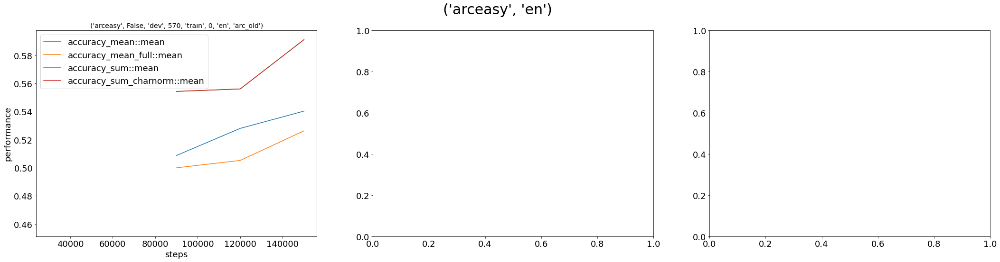

In [12]:
from math import ceil

# Determine best metric per settings
# Get the mean of the results per model and report the best metric.
value_cols1 = [x for x in value_cols_all if x in df_selected.columns]
print(value_cols1)
index_cols1 = ["calibration", "task", "eval_set", "eval_examples_cnt", "train_set", "nb_few_shot_samples", 
              "language", "template", ]
cols1 = ["model_name"]
pt2 = pd.pivot_table(df_selected, values=value_cols1, index=index_cols1,
                    columns=cols1, aggfunc=np.mean)
pt2 = pt2.swaplevel(0, 1, axis=0).sort_index(axis=1)
#pt1 = pt1.stack()
#display(pt1)
output_tsv = output_results_file_prefix + ".task.model.formatted.tsv"

model_to_x_axis = {
    "dense_7.5B_lang30_new_cc100_xl_unigram__step00005000": 5000,
    "dense_7.5B_lang30_new_cc100_xl_unigram__step00015000": 15000,
    "dense_7.5B_lang30_new_cc100_xl_unigram__step00030000": 30000,
    "dense_7.5B_lang30_new_cc100_xl_unigram__step00050000": 50000,
    "dense_7.5B_lang30_new_cc100_xl_unigram__step00055000": 55000,
    "dense_7.5B_lang30_new_cc100_xl_unigram__step00060000": 60000,
    "dense_7.5B_lang30_new_cc100_xl_unigram__step00065000": 65000,
    "dense_7.5B_lang30_new_cc100_xl_unigram__step00090000": 90000,
    "dense_7.5B_lang30_new_cc100_xl_unigram__step00120000": 120000,
    "dense_7.5B_lang30_new_cc100_xl_unigram__step00150000": 150000,
}
x_label = "steps"
y_label = "performance"

pt2.to_csv(output_tsv, sep="\t")


task_to_result_cnt = {idx: int(x) for idx,x in pt1.groupby(["task", "language"]).size().items()}
multi_plot_columns = 3
print(task_to_result_cnt)
group_key = None
flatten_axes = None
curr_ax_id = -1

show_error = False
plt.rc('font', size=18)
plt.rc('axes', titlesize=14)
for idx, row in pt2.iterrows():
    eval_size = idx[3]
    title = idx
    metrics_to_model_vals = {}
    for (metric, model), val in row.iteritems():
        if metric not in metrics_to_model_vals:
            metrics_to_model_vals[metric] = []
        metrics_to_model_vals[metric].append((model, model_to_x_axis.get(model, 0), val))
    #metrics_to_model_vals = [(kk, vv) for kk, vv in sorted([(k, v) for k,v in metrics_to_model_vals.items()], reverse=True, key=lambda x: np.mean([xx for xx in x[1] if isinstance(xx, float)]))]
    #print(metrics_to_model_vals)
    # plot checkpoints vs metrics
    
    curr_key = (idx[0], idx[6]) # task and template from idx
    if group_key is None or curr_key != group_key:
        if group_key is not None:
            print(group_key)
            plt.show()
    
        group_key = curr_key
        group_size = task_to_result_cnt[curr_key]
        ncols, nrows = multi_plot_columns, ceil(group_size/multi_plot_columns)
        fig, axes_main = plt.subplots(ncols=ncols, nrows=nrows, figsize=(12*ncols,8*nrows))
        fig.suptitle(group_key, fontsize=30)
        
        flatten_axes = axes_main.flatten()
        curr_ax_id = -1
    curr_ax_id += 1
    
    ax_main = flatten_axes[curr_ax_id]
    for metric, model_with_values in metrics_to_model_vals.items():
        models, x_vals, y_vals = zip(*model_with_values)
        
        if len([y for y in y_vals if y > 0])==0:
            continue
        
        if show_error:
            err = np.array(list(zip(*[st_get_sigrange(yy, eval_size) for yy in y_vals])))
            ax_main.errorbar(x_vals, y_vals, err, label=metric)
        else:
            print(x_vals)
            print(y_vals)
            ax_main.plot(x_vals, y_vals, label=metric)
            
    
    ax_main.set_ylabel(y_label)
    ax_main.set_xlabel(x_label)
    ax_main.legend()
    #ax_main.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2))
    ax_main.set_title(title)
    
    break
    #display(df1)
    #model_scores = [(model0, scores0 if isinstance(scores0, list) else [scores0]) for model0, scores0 in row.iteritems()]
    #print(model_scores)
    
    
#print("Open the following file in gsheets to see the full table:")
#print(output_tsv)
#pt1


In [13]:
a = {kk:vv for kk, vv in sorted([(k, v) for k,v in metrics_to_model_vals.items()], reverse=True, key=lambda x: np.mean([xx for xx in x[1] if isinstance(xx, float)]))}
#metrics_to_model_vals = {kk: vv for kk, vv in sorted([(k, v) for k,v in metrics_to_model_vals.items()], reverse=True, key=lambda x: np.mean([xx[-1] for xx in x if xx > 0]))}

# Detailed comparison between model runs and the significance of results

xnli
(False, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli__en', 'ar')


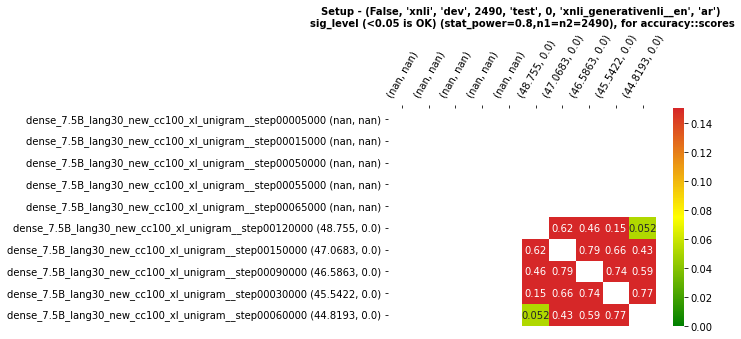

(False, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli__en', 'bg')


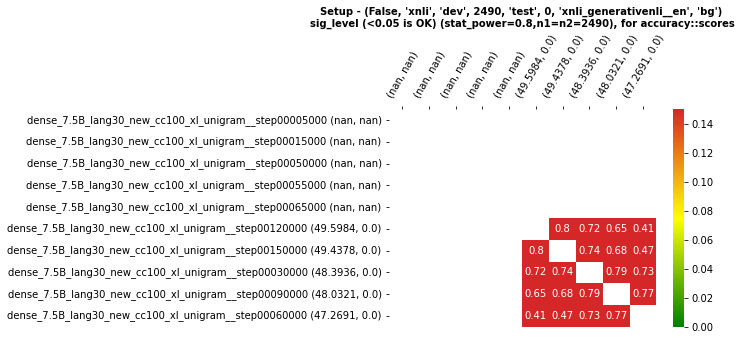

(False, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli__en', 'de')


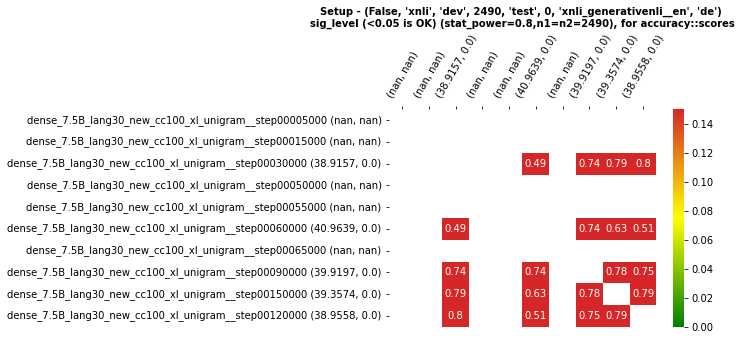

(False, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli__en', 'el')


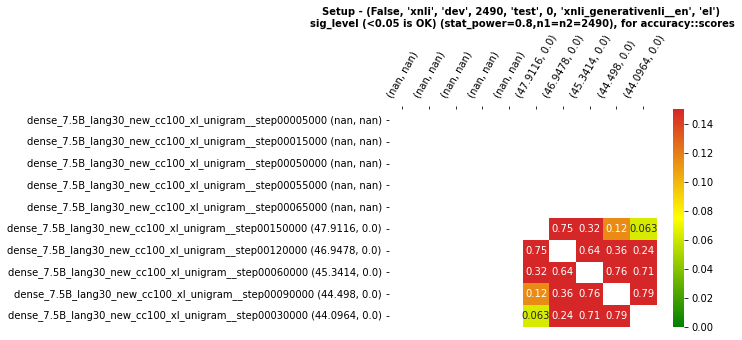

(False, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli__en', 'en')


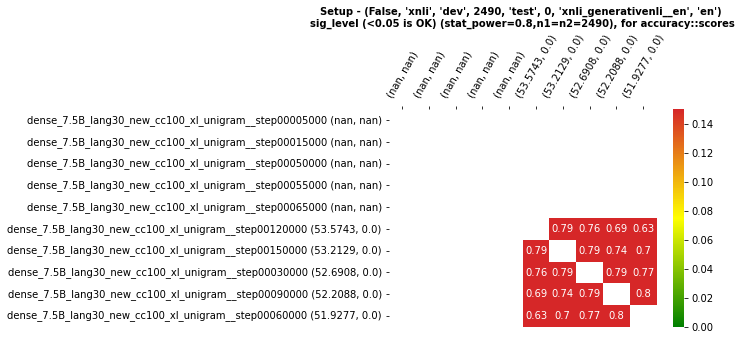

(False, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli__en', 'es')


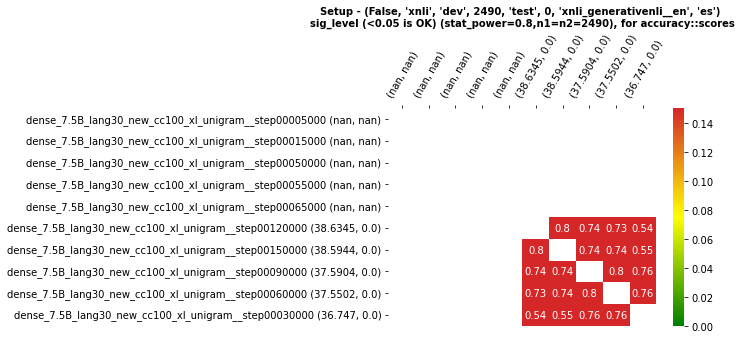

(False, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli__en', 'fr')


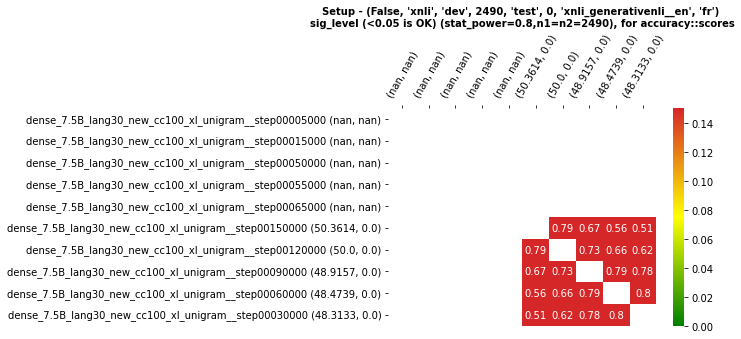

(False, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli__en', 'ru')


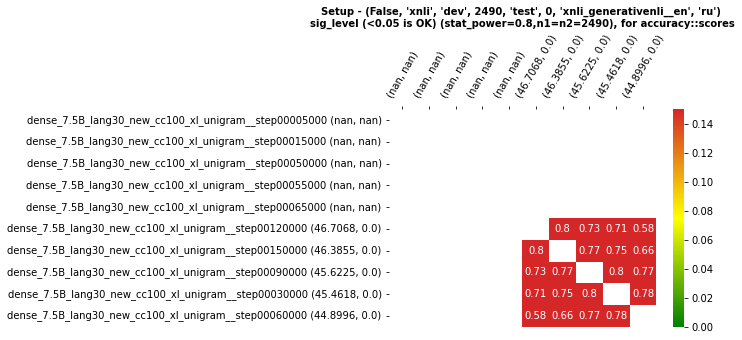

(False, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli__en', 'tr')


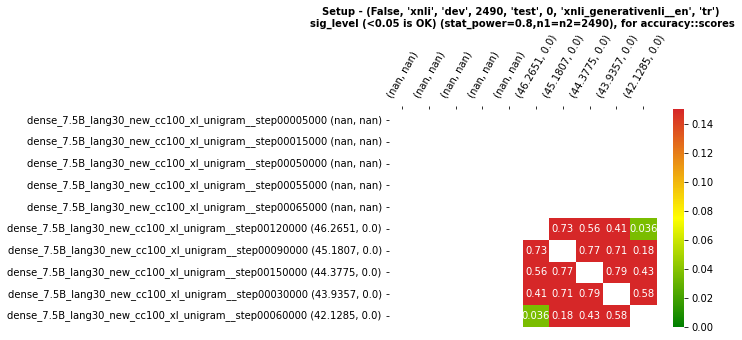

(False, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli__en', 'vi')


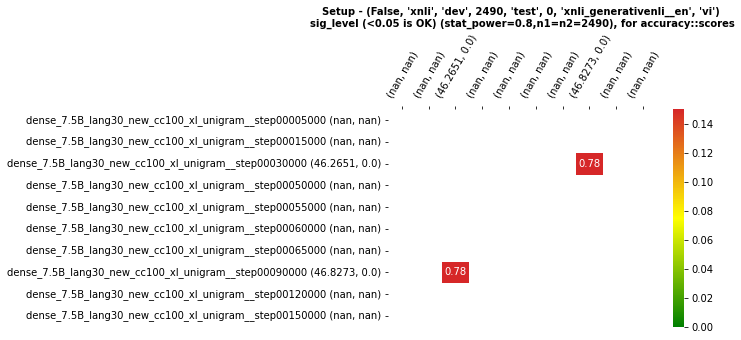

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli__en', 'ar')


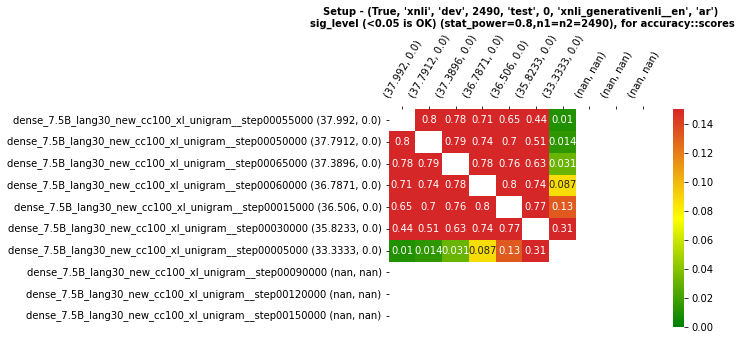

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli__en', 'bg')


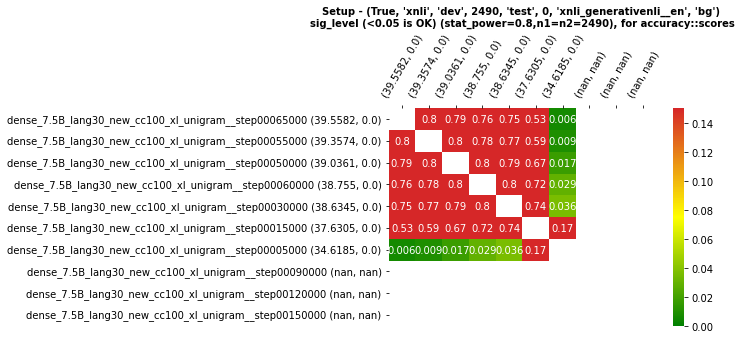

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli__en', 'de')


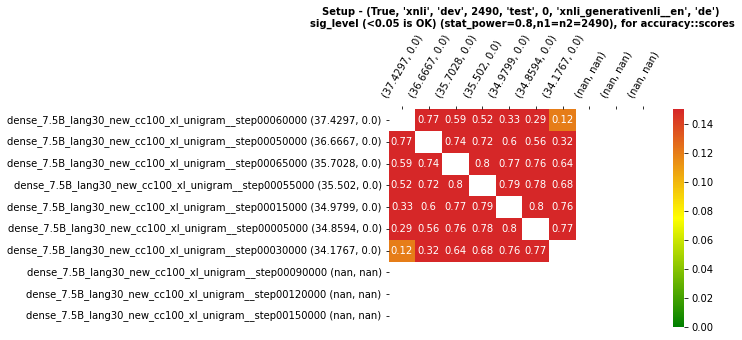

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli__en', 'el')


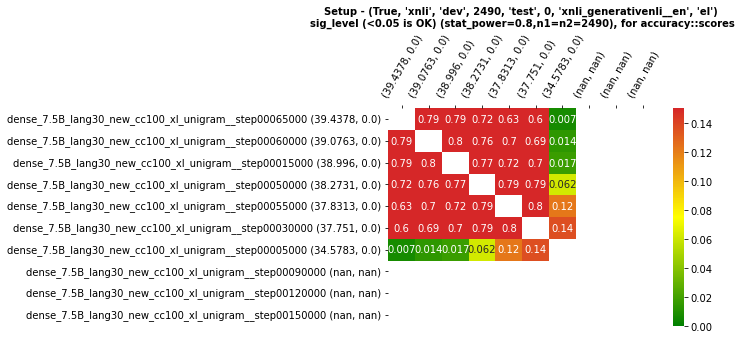

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli__en', 'en')
p1=0.3493975903614458, p2=0.4775100401606426 - f(a) and f(b) must have different signs


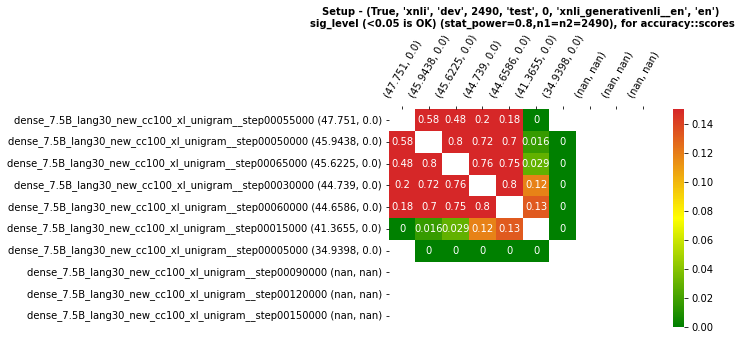

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli__en', 'es')
p1=0.40562248995983935, p2=0.40562248995983935 - Cannot detect an effect-size of 0. Try changing your effect-size.


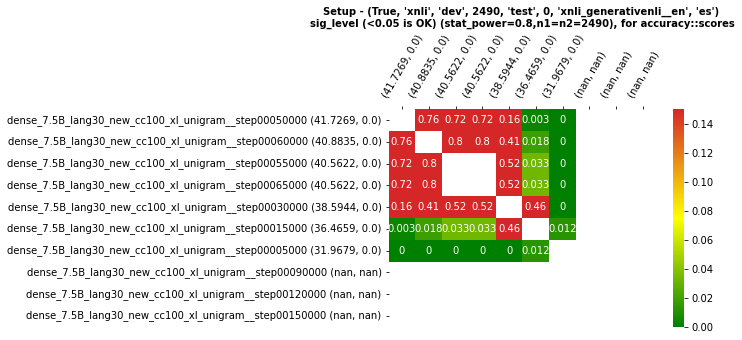

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli__en', 'fr')
p1=0.39799196787148594, p2=0.39799196787148594 - Cannot detect an effect-size of 0. Try changing your effect-size.


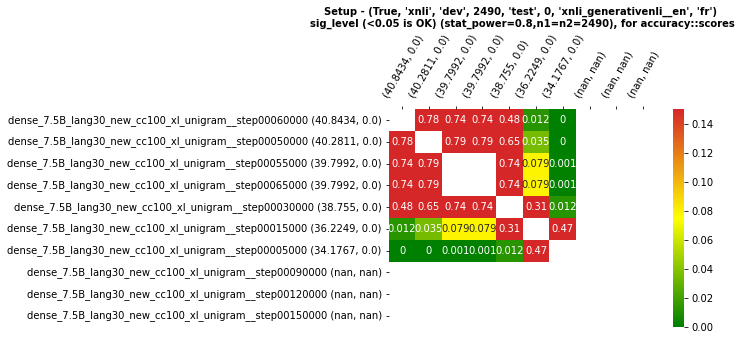

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli__en', 'hi')


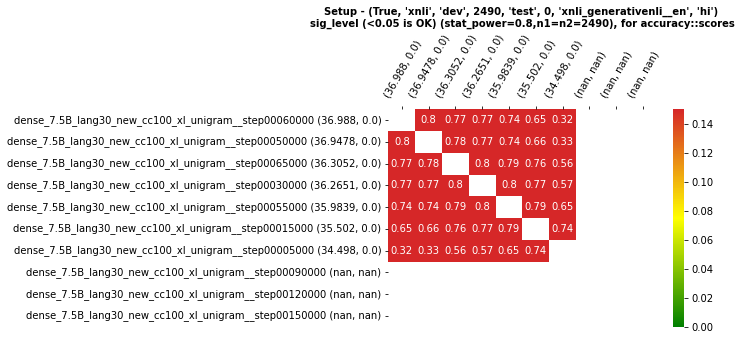

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli__en', 'ru')


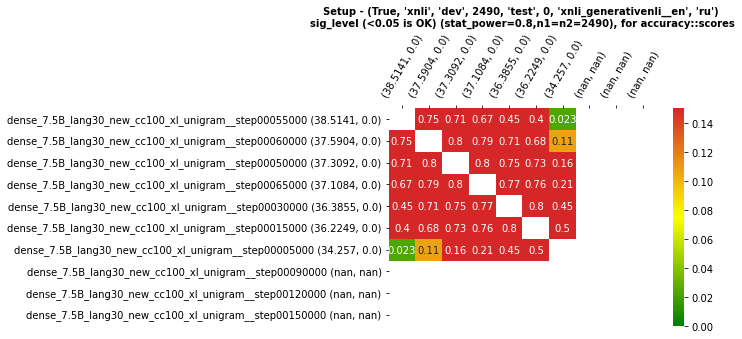

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli__en', 'sw')


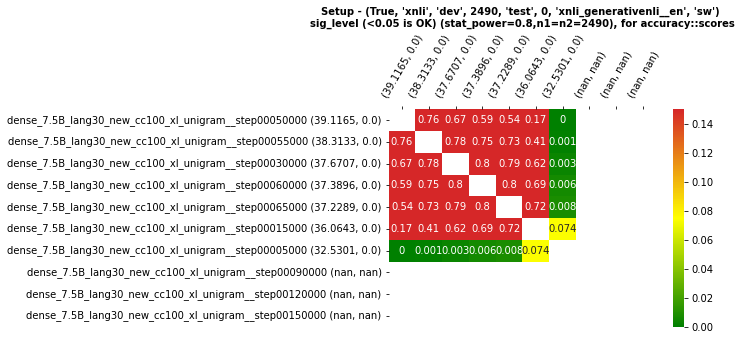

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli__en', 'th')


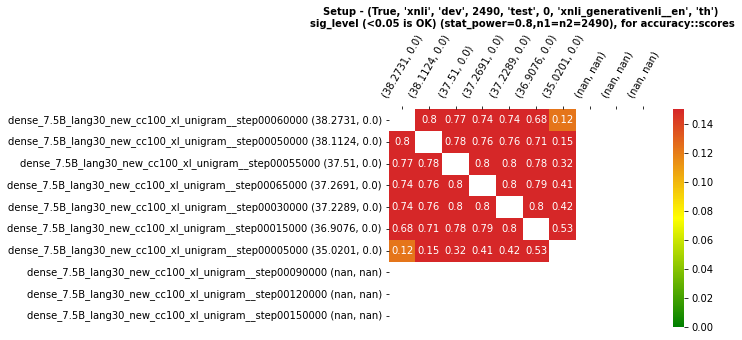

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli__en', 'tr')


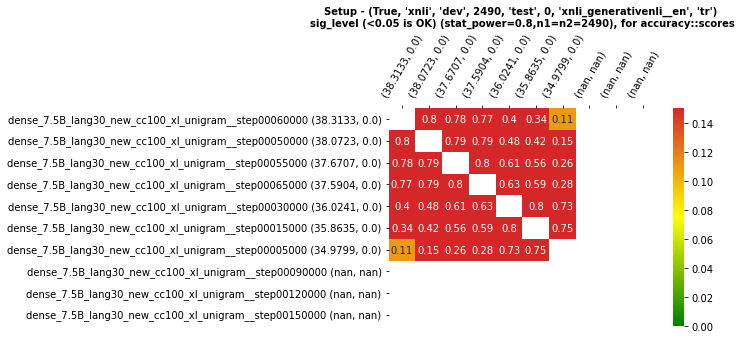

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli__en', 'ur')
p1=0.35261044176706824, p2=0.35261044176706824 - Cannot detect an effect-size of 0. Try changing your effect-size.


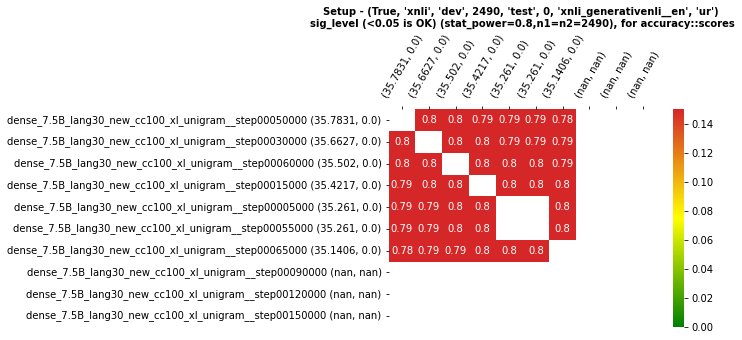

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli__en', 'vi')


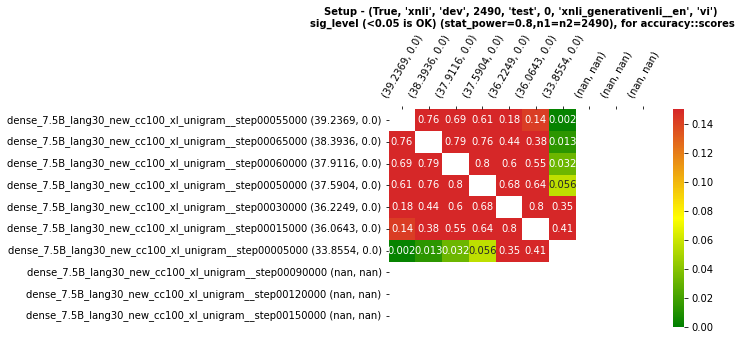

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli__en', 'zh')


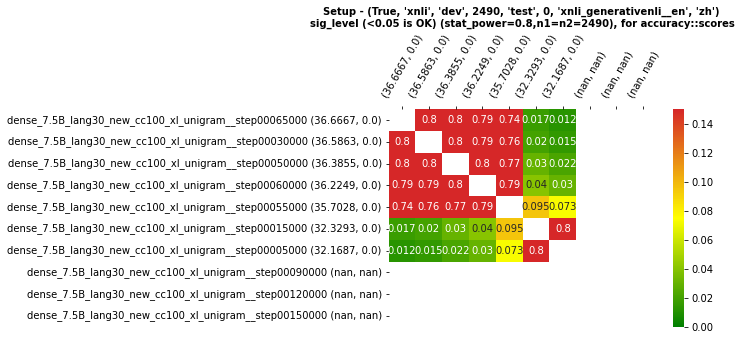

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_ht', 'ar')


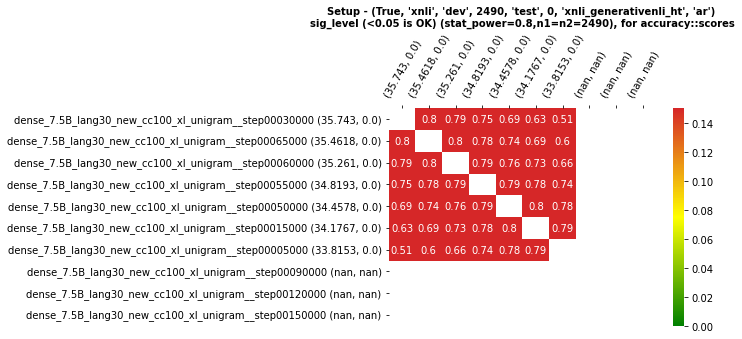

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_ht', 'bg')


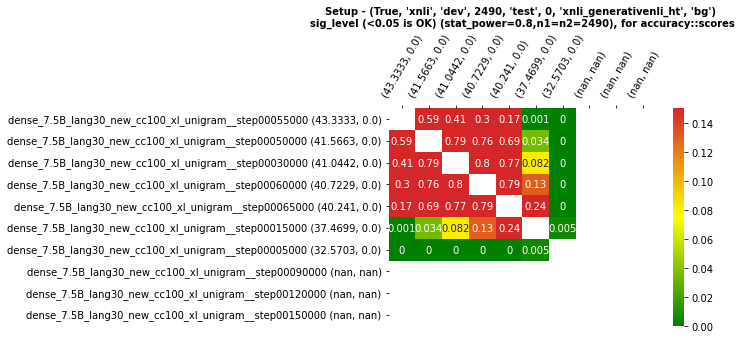

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_ht', 'de')


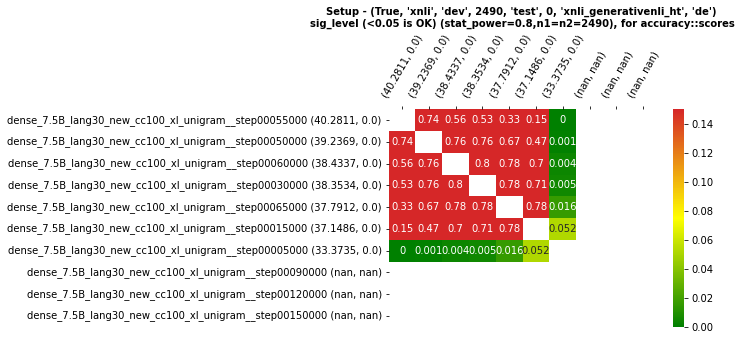

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_ht', 'el')


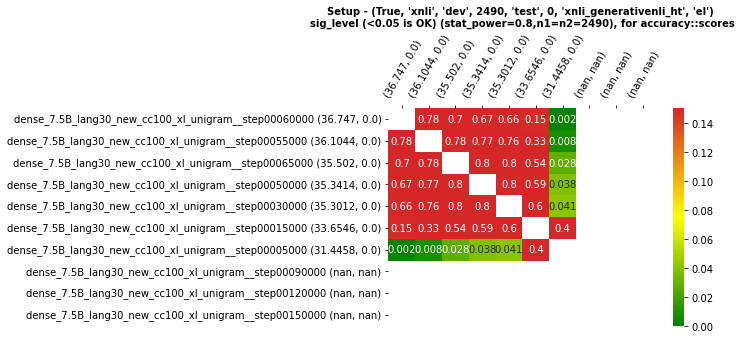

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_ht', 'en')
p1=0.3493975903614458, p2=0.4775100401606426 - f(a) and f(b) must have different signs


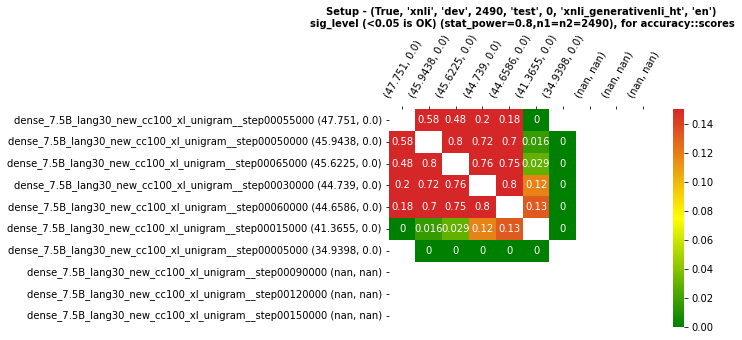

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_ht', 'es')
p1=0.334136546184739, p2=0.44779116465863456 - f(a) and f(b) must have different signs


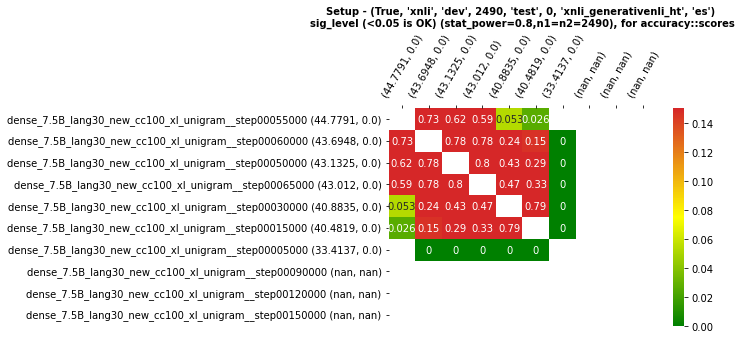

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_ht', 'fr')


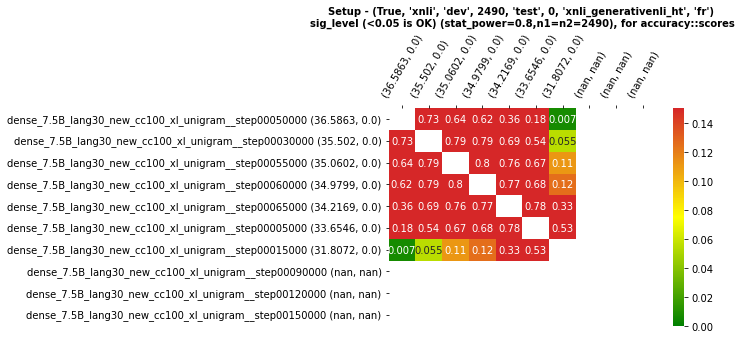

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_ht', 'hi')


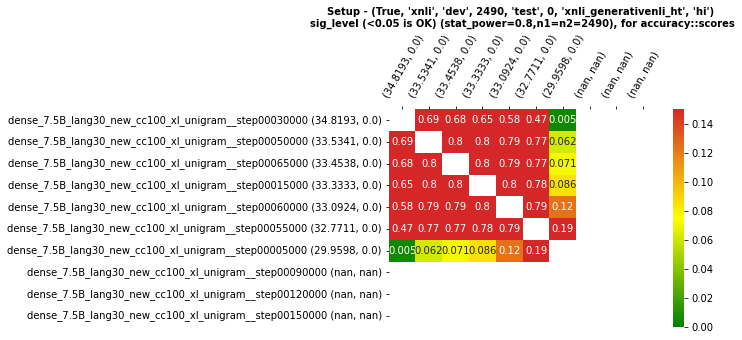

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_ht', 'ru')


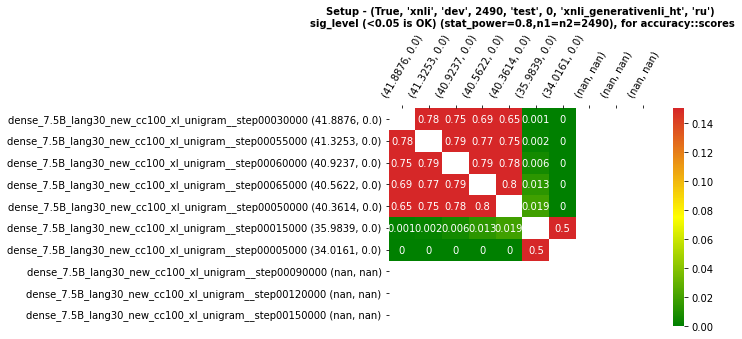

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_ht', 'sw')


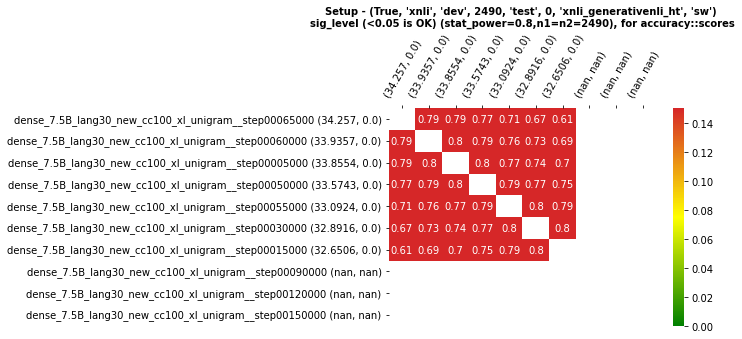

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_ht', 'th')


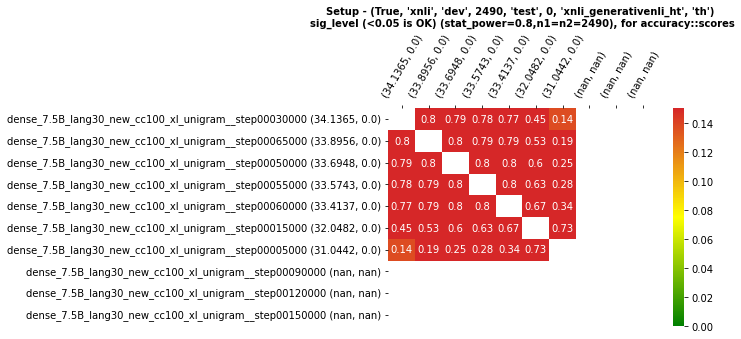

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_ht', 'tr')


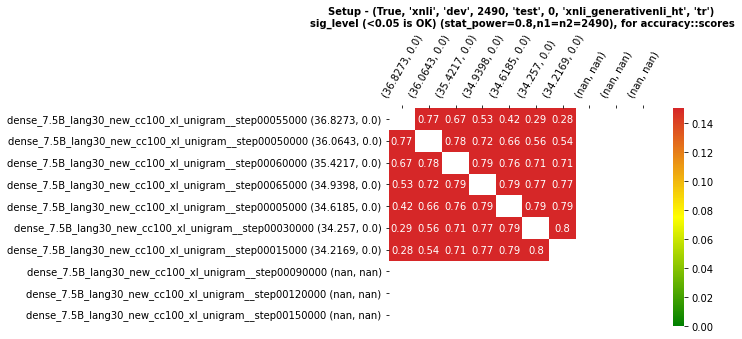

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_ht', 'ur')


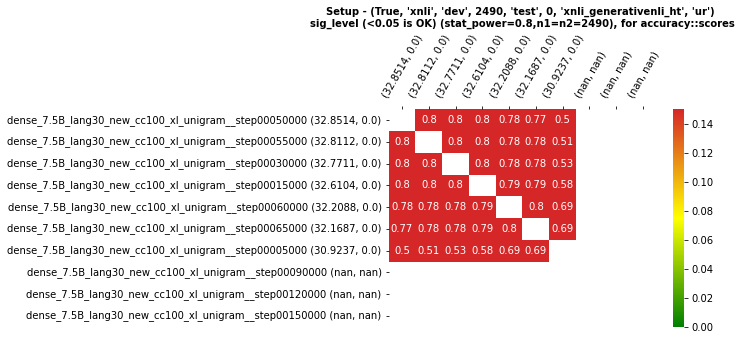

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_ht', 'vi')


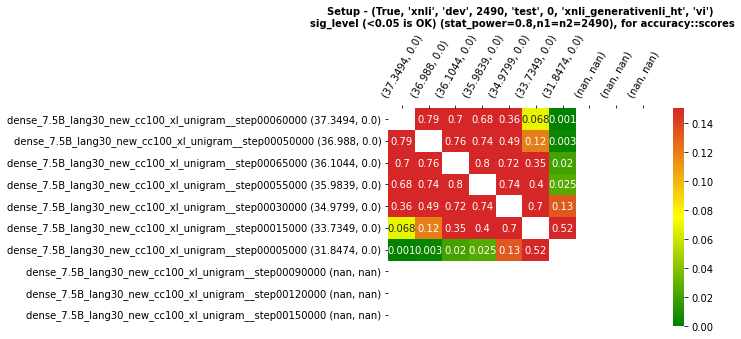

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_ht', 'zh')
p1=0.3457831325301205, p2=0.3457831325301205 - Cannot detect an effect-size of 0. Try changing your effect-size.


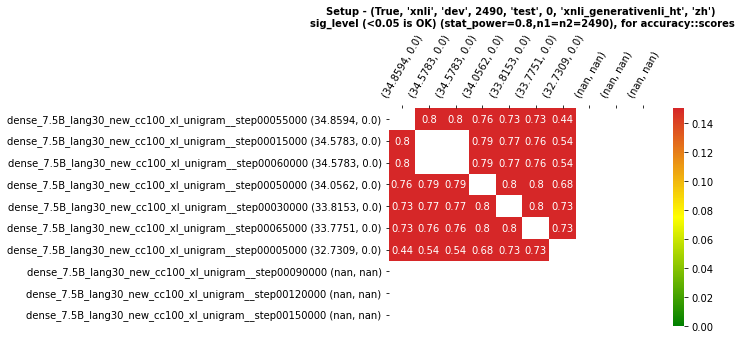

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_mt', 'ar')


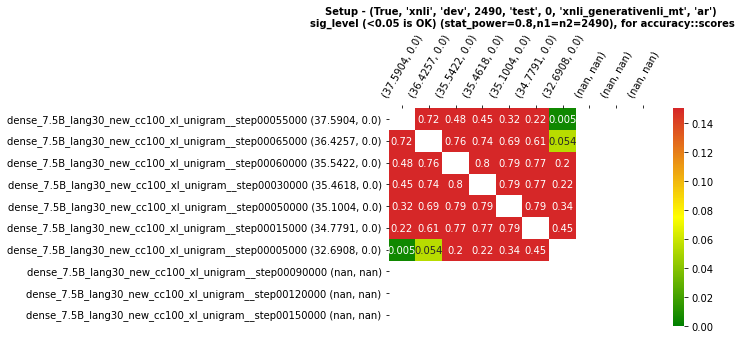

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_mt', 'bg')


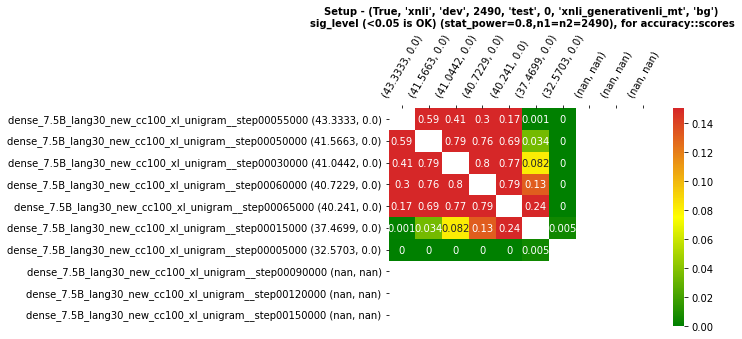

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_mt', 'de')


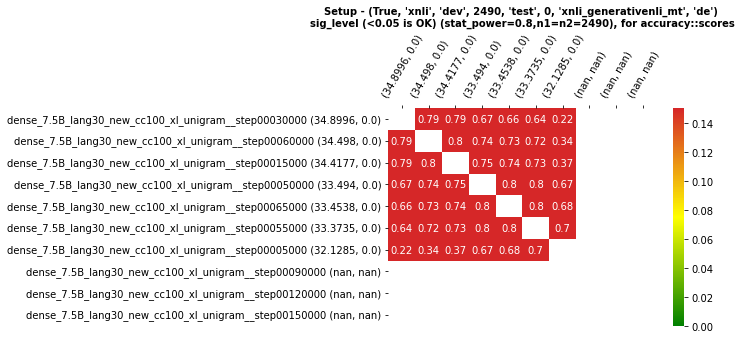

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_mt', 'el')


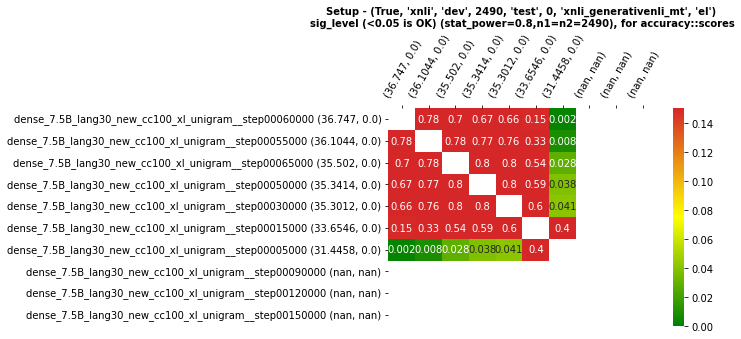

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_mt', 'en')
p1=0.3493975903614458, p2=0.4775100401606426 - f(a) and f(b) must have different signs


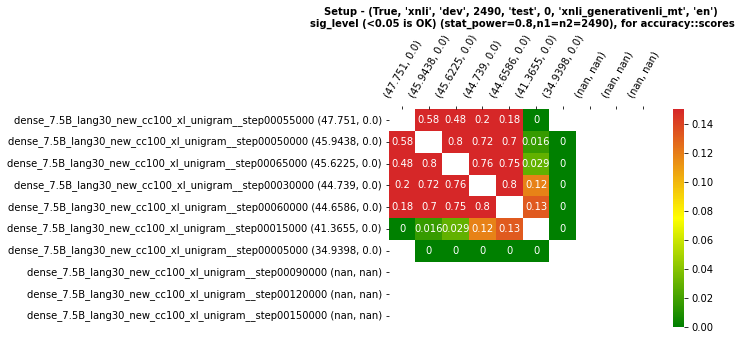

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_mt', 'es')


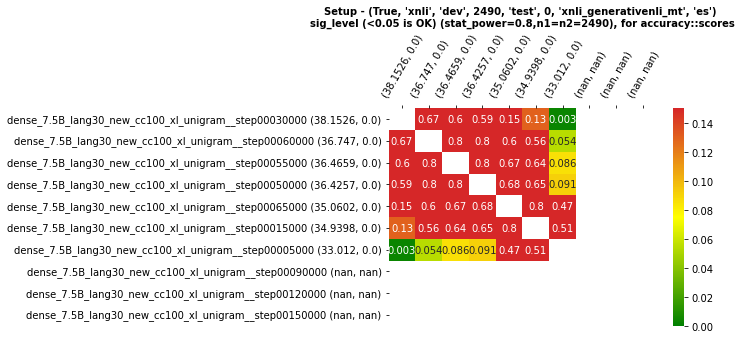

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_mt', 'fr')


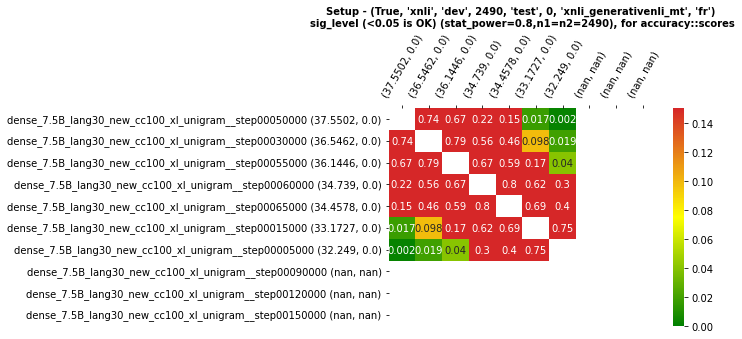

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_mt', 'hi')


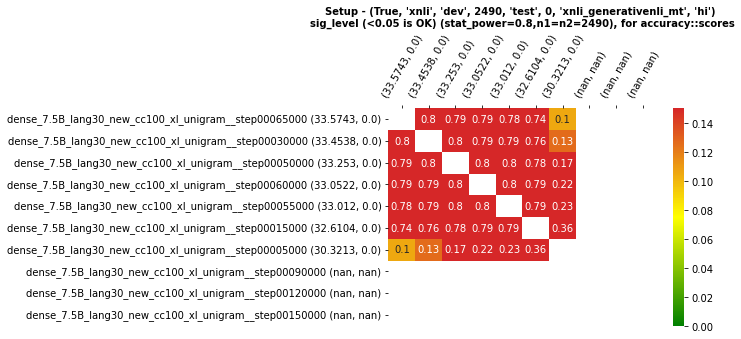

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_mt', 'ru')


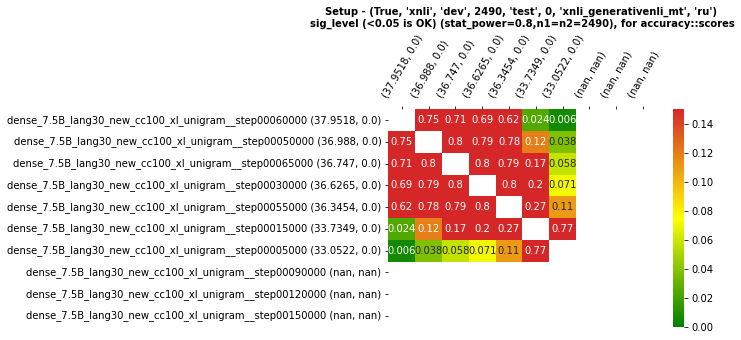

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_mt', 'sw')


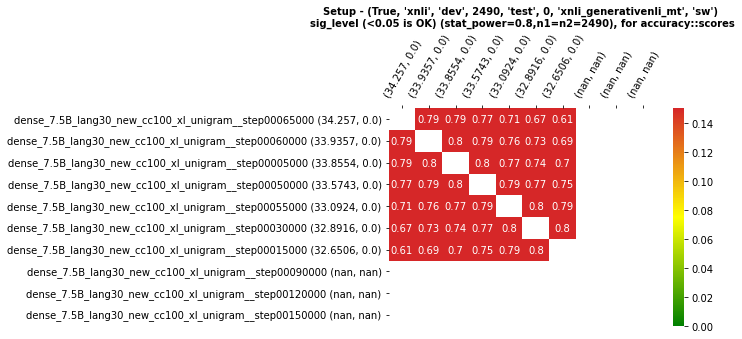

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_mt', 'th')
p1=0.3506024096385542, p2=0.3506024096385542 - Cannot detect an effect-size of 0. Try changing your effect-size.


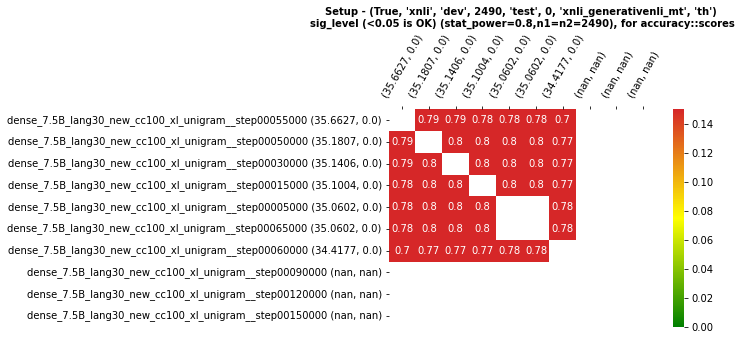

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_mt', 'tr')


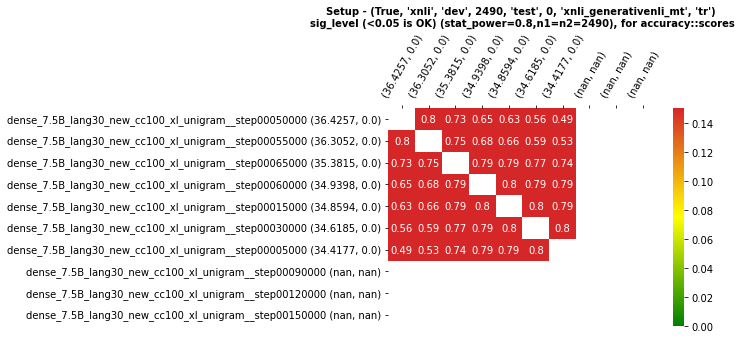

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_mt', 'ur')


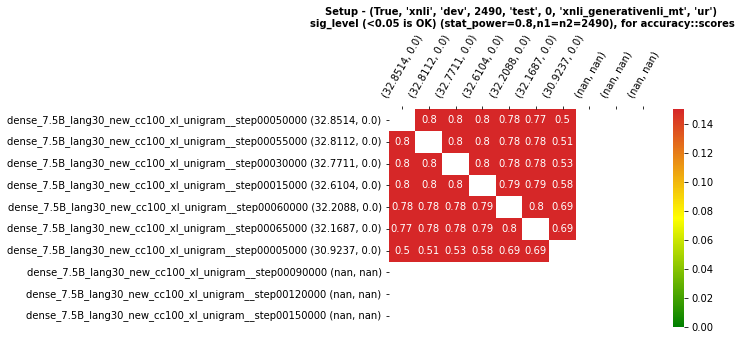

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_mt', 'vi')


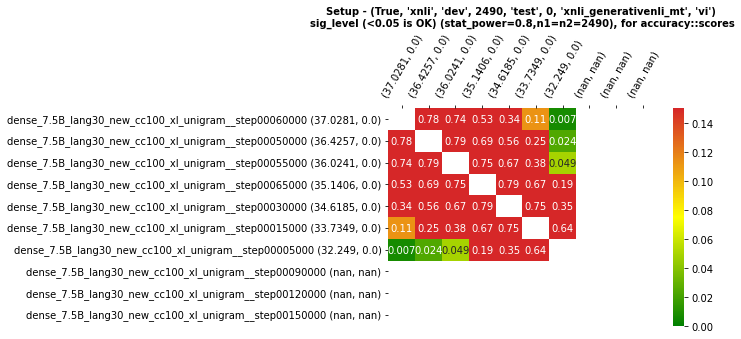

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_mt', 'zh')


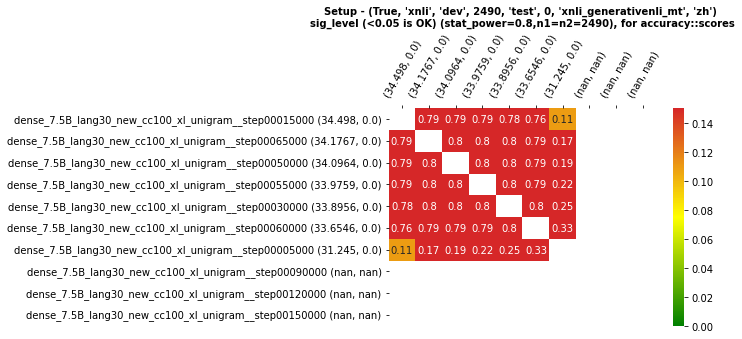

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence__en', 'ar')


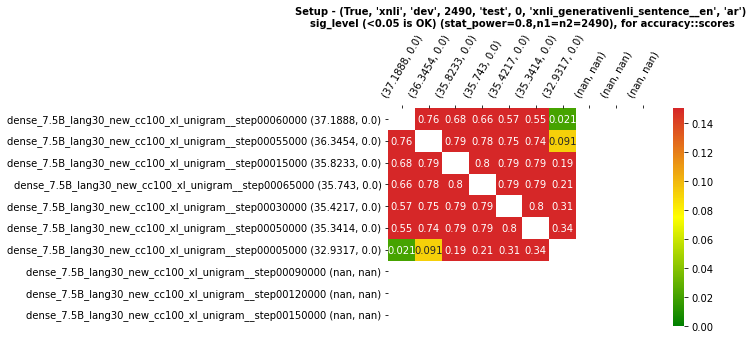

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence__en', 'bg')


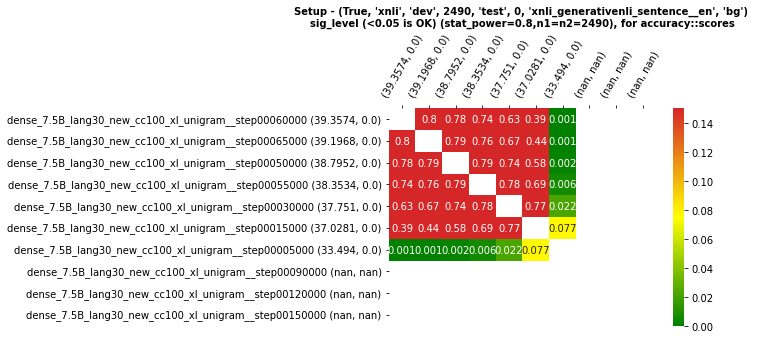

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence__en', 'de')


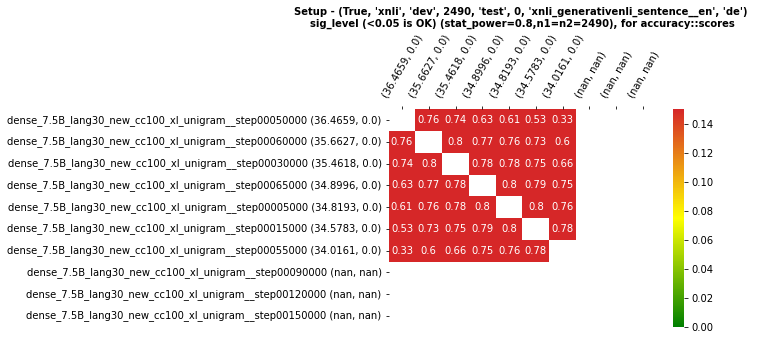

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence__en', 'el')


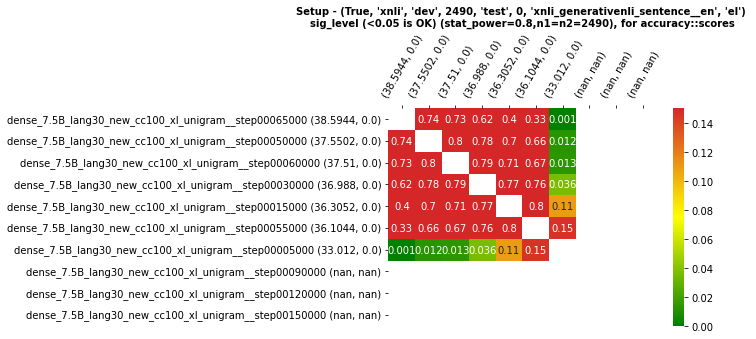

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence__en', 'en')
p1=0.342570281124498, p2=0.4610441767068273 - f(a) and f(b) must have different signs


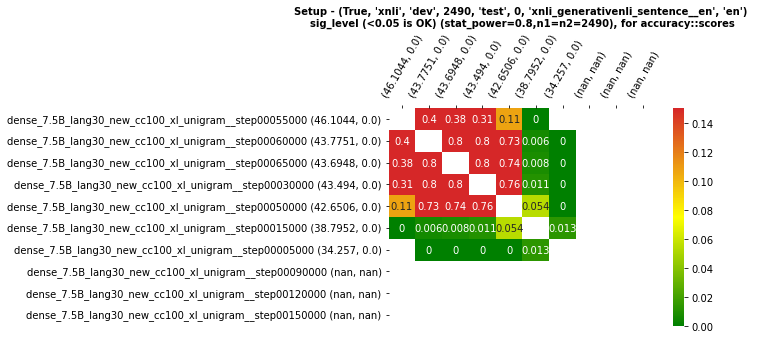

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence__en', 'es')


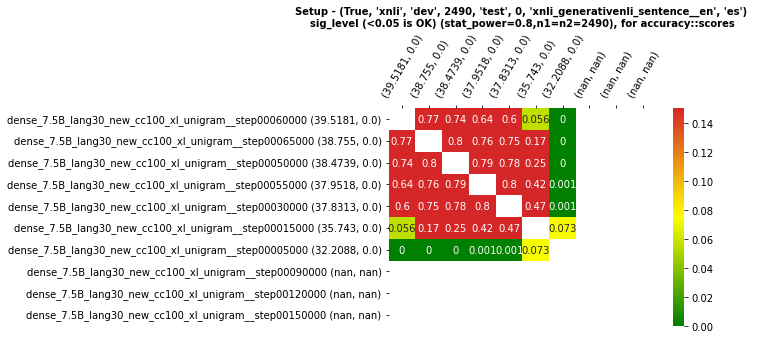

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence__en', 'fr')


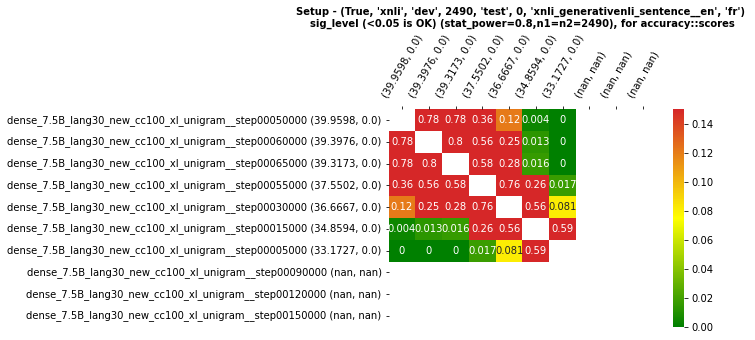

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence__en', 'hi')


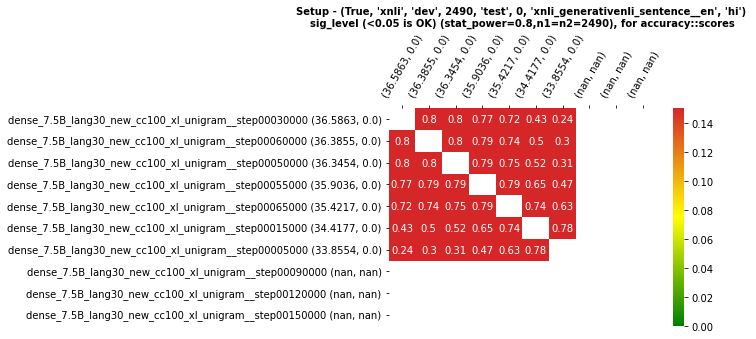

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence__en', 'ru')


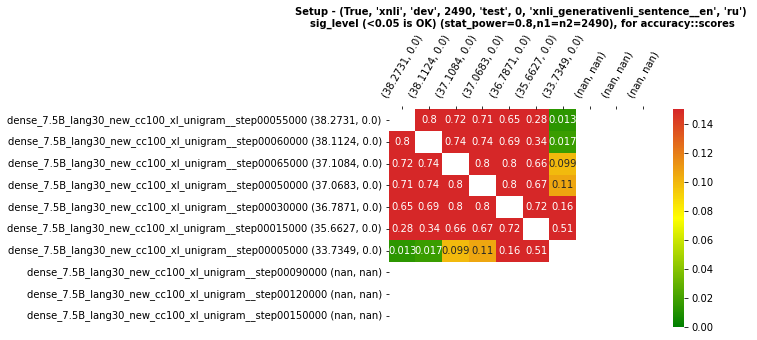

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence__en', 'sw')


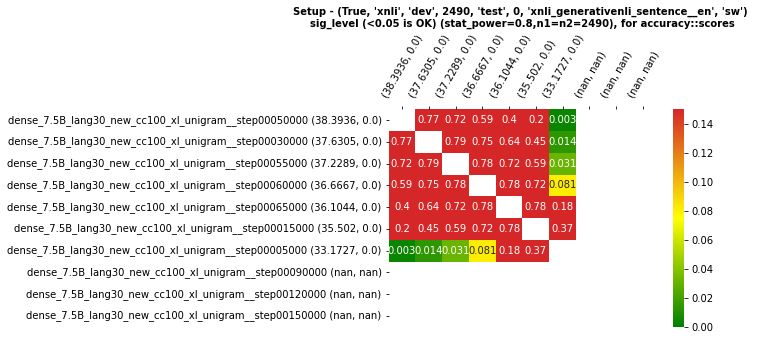

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence__en', 'th')


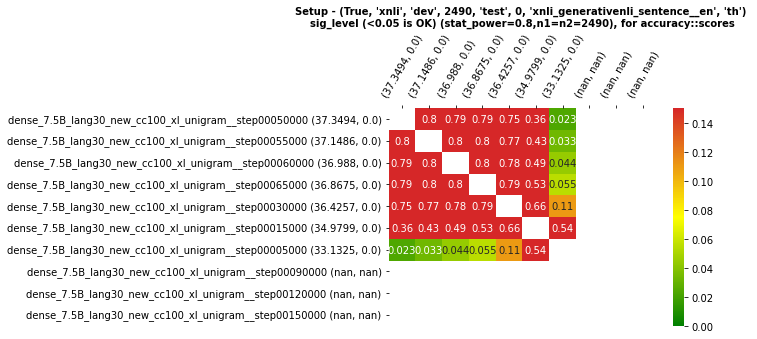

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence__en', 'tr')


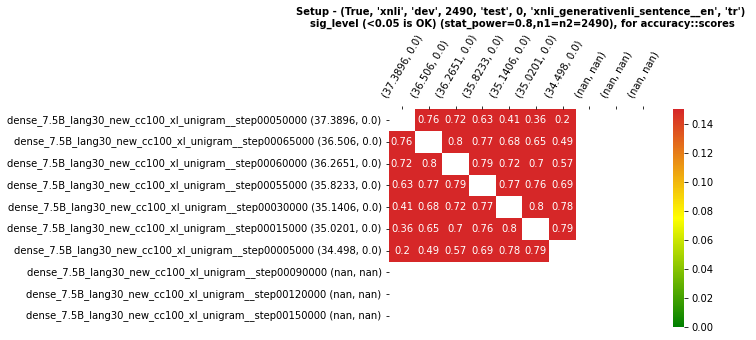

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence__en', 'ur')


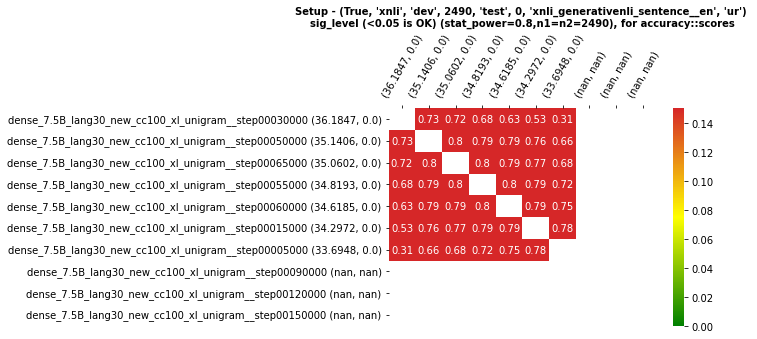

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence__en', 'vi')


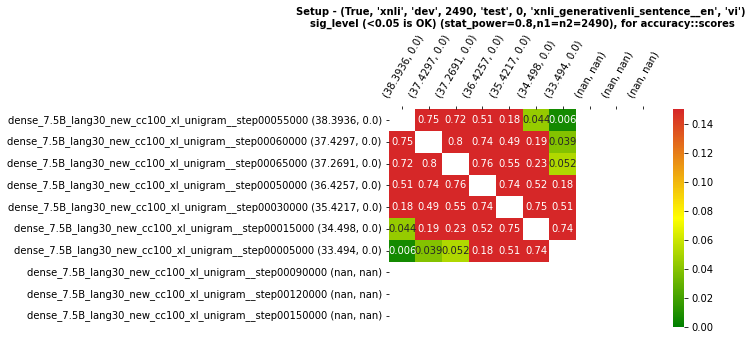

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence__en', 'zh')


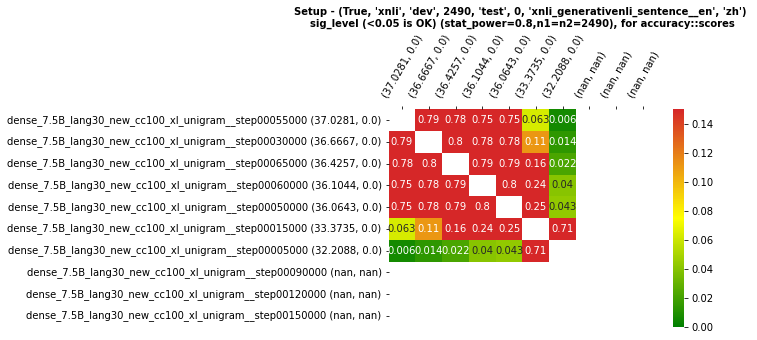

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence_mt', 'ar')


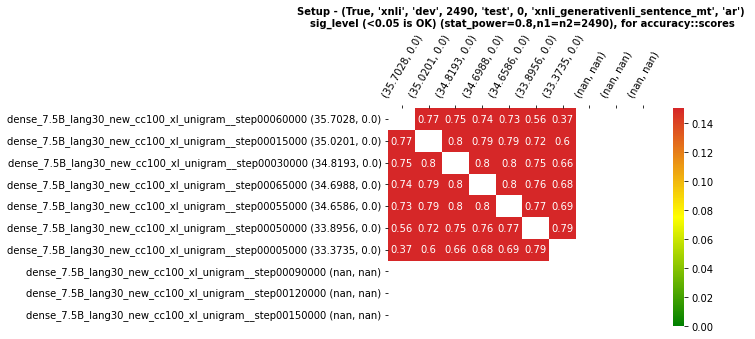

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence_mt', 'bg')


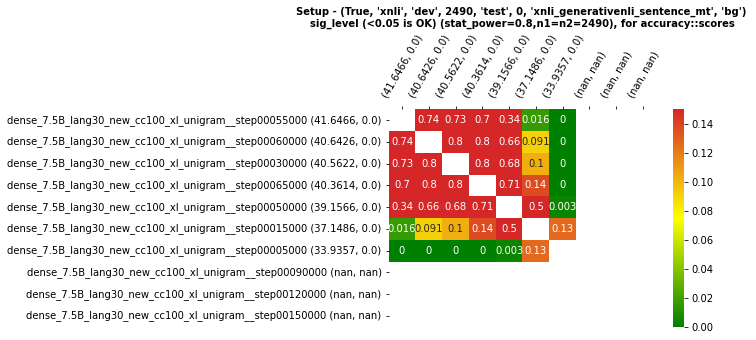

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence_mt', 'de')


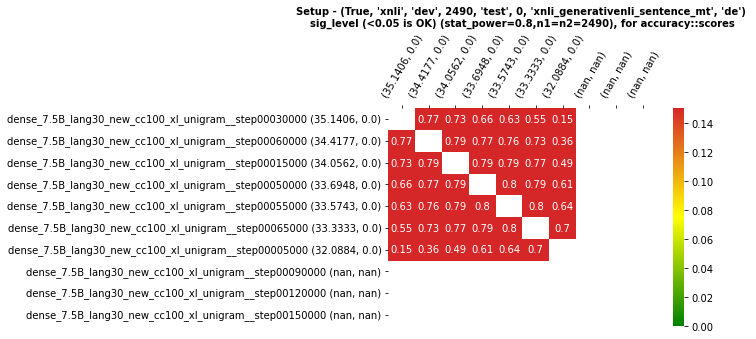

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence_mt', 'el')


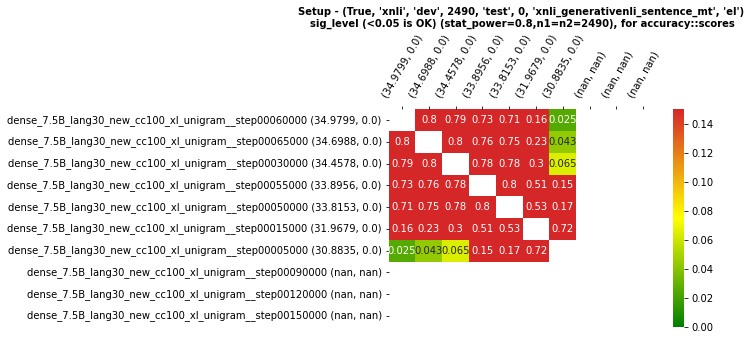

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence_mt', 'en')
p1=0.42851405622489963, p2=0.42851405622489963 - Cannot detect an effect-size of 0. Try changing your effect-size.
p1=0.3433734939759036, p2=0.4610441767068273 - f(a) and f(b) must have different signs


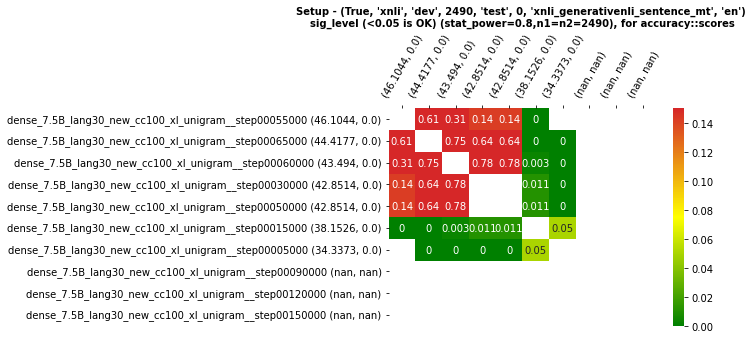

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence_mt', 'es')


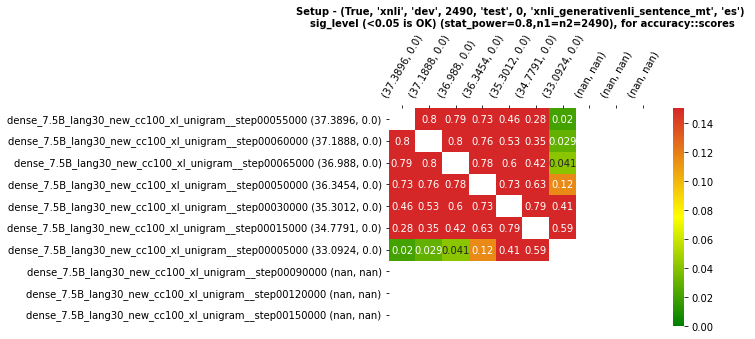

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence_mt', 'fr')


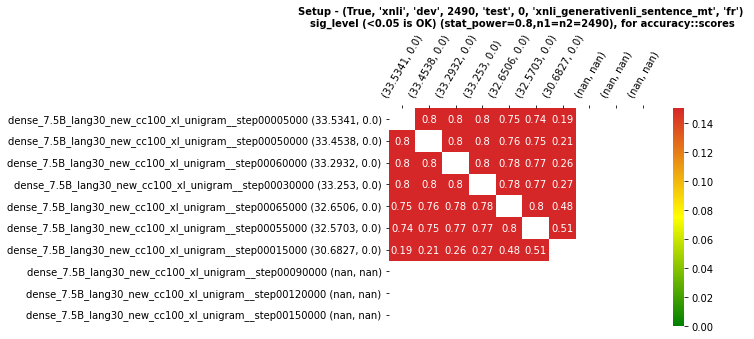

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence_mt', 'hi')


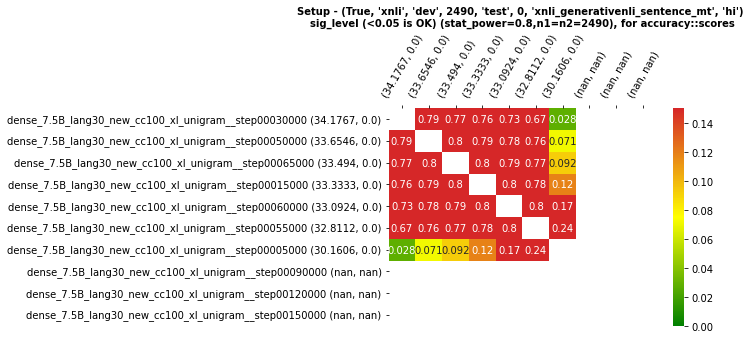

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence_mt', 'ru')


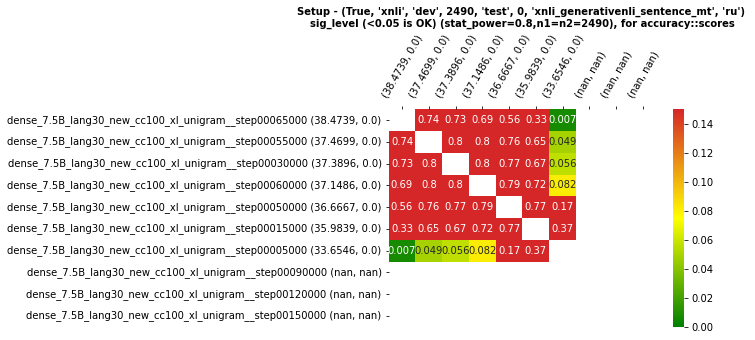

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence_mt', 'sw')


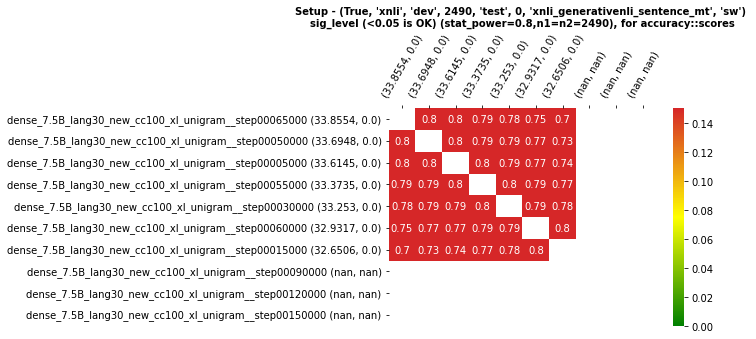

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence_mt', 'th')


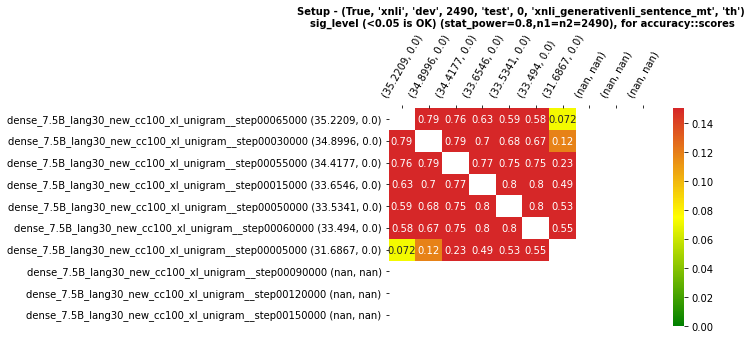

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence_mt', 'tr')


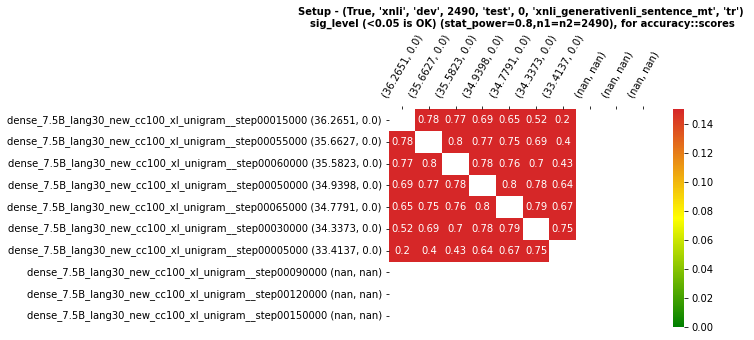

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence_mt', 'ur')
p1=0.32088353413654613, p2=0.32088353413654613 - Cannot detect an effect-size of 0. Try changing your effect-size.


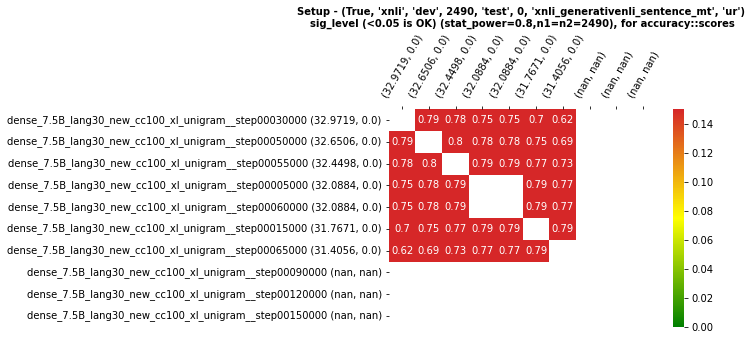

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence_mt', 'vi')


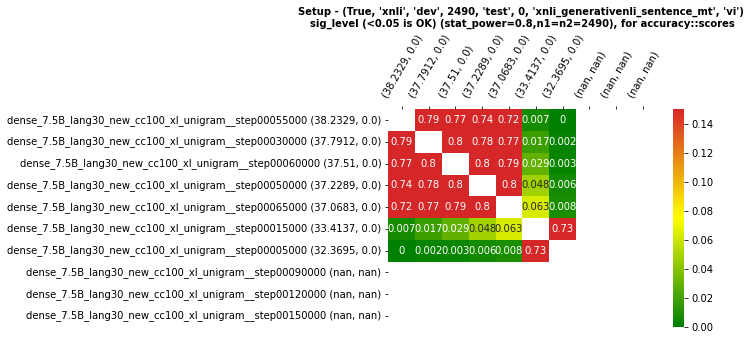

(True, 'xnli', 'dev', 2490, 'test', 0, 'xnli_generativenli_sentence_mt', 'zh')


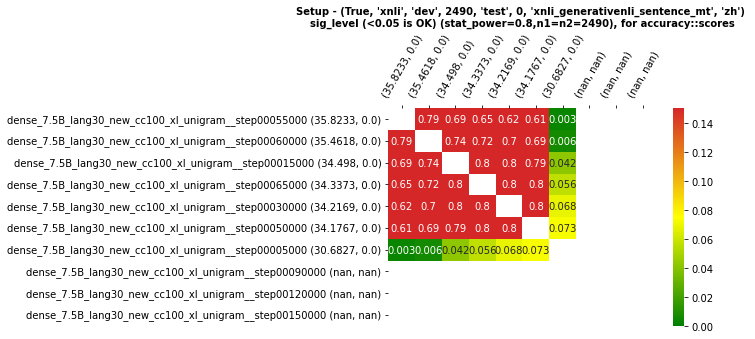

blimp__sentential_negation_npi_licensor_present
(False, 'blimp__sentential_negation_npi_licensor_present', 'sentential_negation_npi_licensor_present', 1000, 'sentential_negation_npi_licensor_present', 0, 'blimp', 'en')


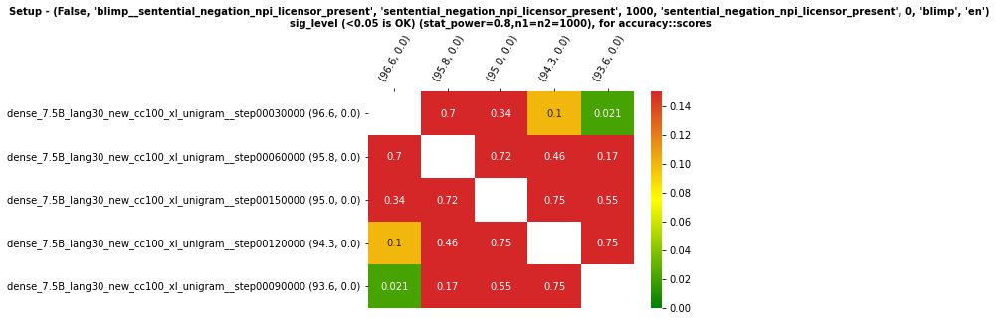

blimp__regular_plural_subject_verb_agreement_2
(False, 'blimp__regular_plural_subject_verb_agreement_2', 'regular_plural_subject_verb_agreement_2', 1000, 'regular_plural_subject_verb_agreement_2', 0, 'blimp', 'en')
p1=0.882, p2=0.882 - Cannot detect an effect-size of 0. Try changing your effect-size.


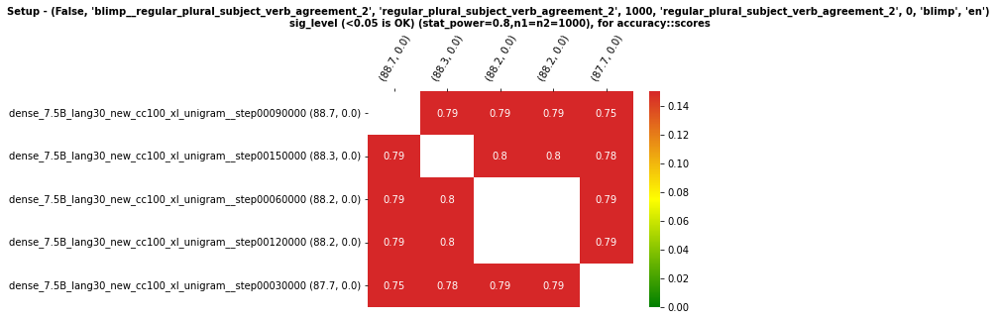

blimp__sentential_subject_island
(False, 'blimp__sentential_subject_island', 'sentential_subject_island', 1000, 'sentential_subject_island', 0, 'blimp', 'en')


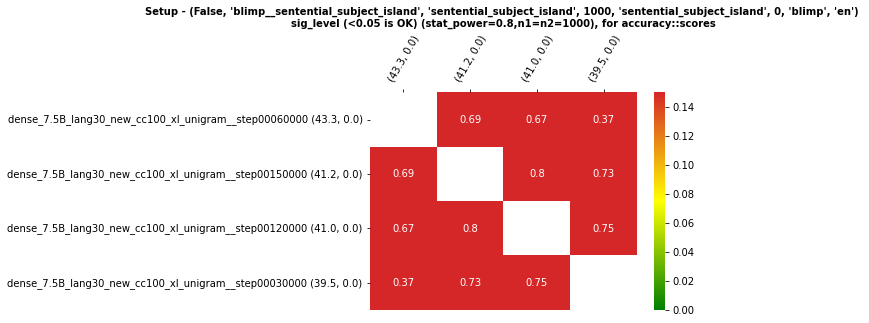

blimp__determiner_noun_agreement_irregular_2
(False, 'blimp__determiner_noun_agreement_irregular_2', 'determiner_noun_agreement_irregular_2', 1000, 'determiner_noun_agreement_irregular_2', 0, 'blimp', 'en')
p1=0.951, p2=0.951 - Cannot detect an effect-size of 0. Try changing your effect-size.


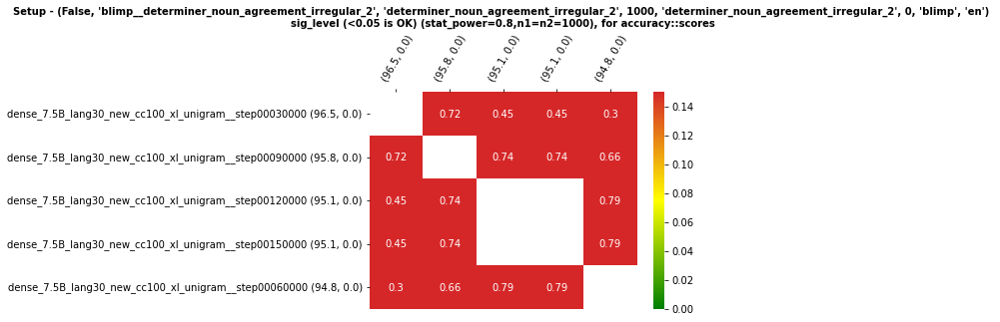

blimp__principle_a_domain_3
(False, 'blimp__principle_a_domain_3', 'principle_a_domain_3', 1000, 'principle_a_domain_3', 0, 'blimp', 'en')


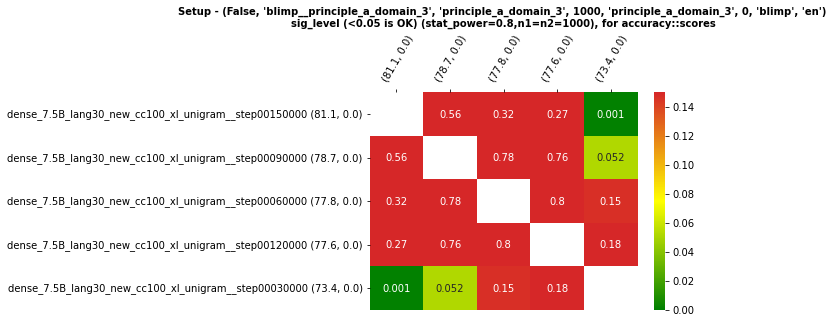

blimp__tough_vs_raising_1
(False, 'blimp__tough_vs_raising_1', 'tough_vs_raising_1', 1000, 'tough_vs_raising_1', 0, 'blimp', 'en')


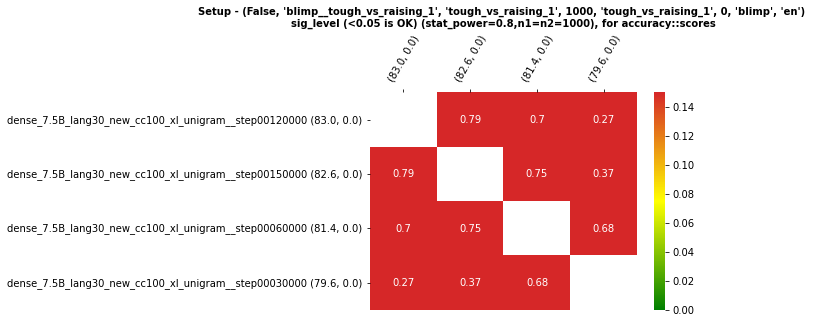

piqa
(False, 'piqa', 'valid', 1838, 'train', 0, 'piqa', 'en')


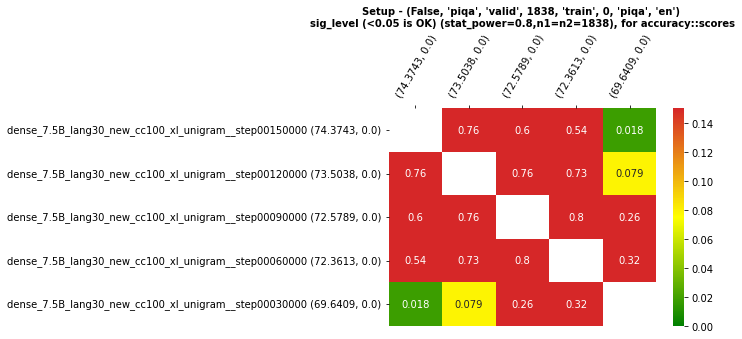

blimp__only_npi_scope
(False, 'blimp__only_npi_scope', 'only_npi_scope', 1000, 'only_npi_scope', 0, 'blimp', 'en')


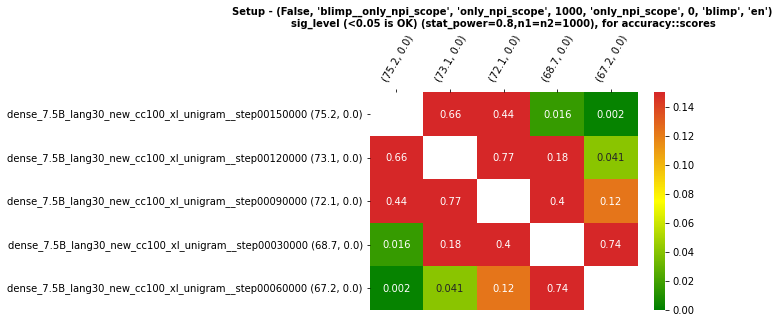

blimp__passive_1
(False, 'blimp__passive_1', 'passive_1', 1000, 'passive_1', 0, 'blimp', 'en')


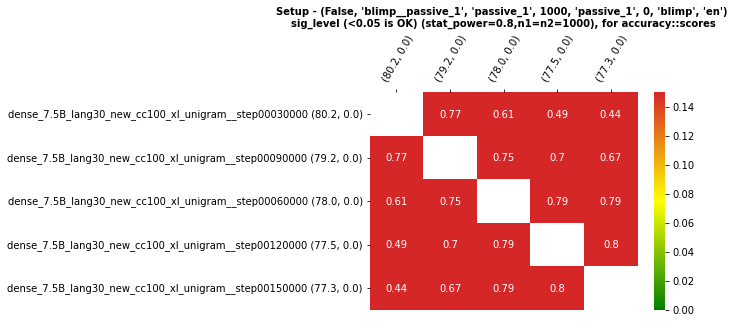

blimp__determiner_noun_agreement_with_adjective_1
(False, 'blimp__determiner_noun_agreement_with_adjective_1', 'determiner_noun_agreement_with_adjective_1', 1000, 'determiner_noun_agreement_with_adjective_1', 0, 'blimp', 'en')


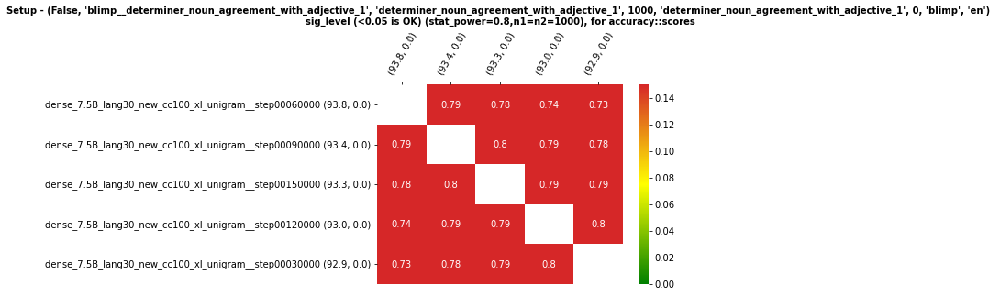

blimp__principle_a_domain_2
(False, 'blimp__principle_a_domain_2', 'principle_a_domain_2', 1000, 'principle_a_domain_2', 0, 'blimp', 'en')


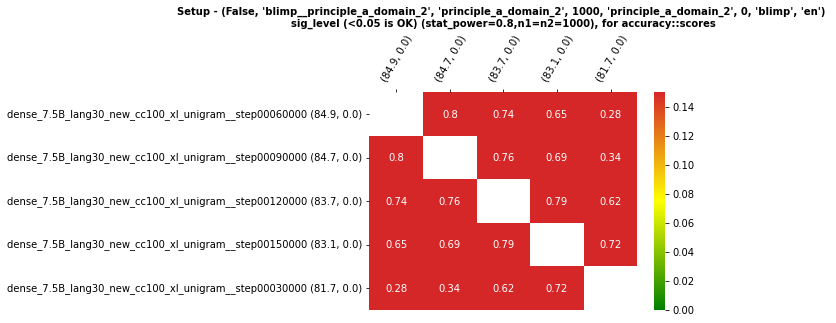

blimp__distractor_agreement_relational_noun
(False, 'blimp__distractor_agreement_relational_noun', 'distractor_agreement_relational_noun', 1000, 'distractor_agreement_relational_noun', 0, 'blimp', 'en')
p1=0.8809999999999999, p2=0.8809999999999999 - Cannot detect an effect-size of 0. Try changing your effect-size.


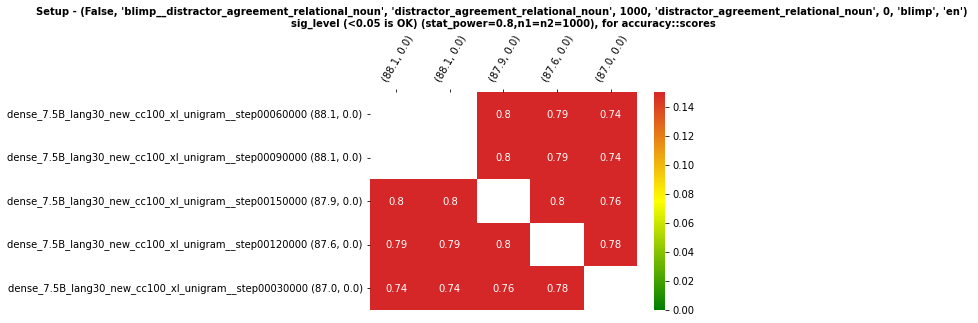

blimp__coordinate_structure_constraint_complex_left_branch
(False, 'blimp__coordinate_structure_constraint_complex_left_branch', 'coordinate_structure_constraint_complex_left_branch', 1000, 'coordinate_structure_constraint_complex_left_branch', 0, 'blimp', 'en')


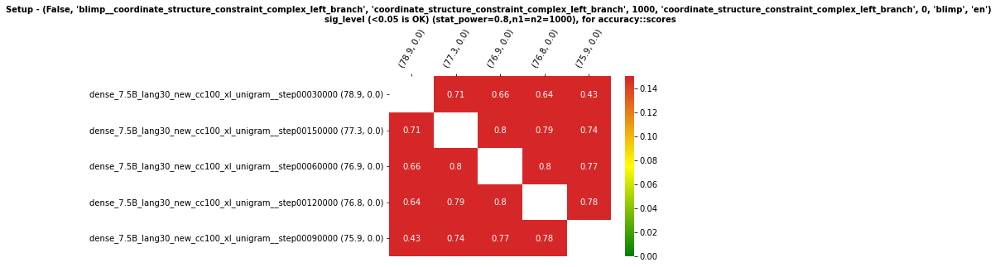

blimp__determiner_noun_agreement_with_adj_2
(False, 'blimp__determiner_noun_agreement_with_adj_2', 'determiner_noun_agreement_with_adj_2', 1000, 'determiner_noun_agreement_with_adj_2', 0, 'blimp', 'en')


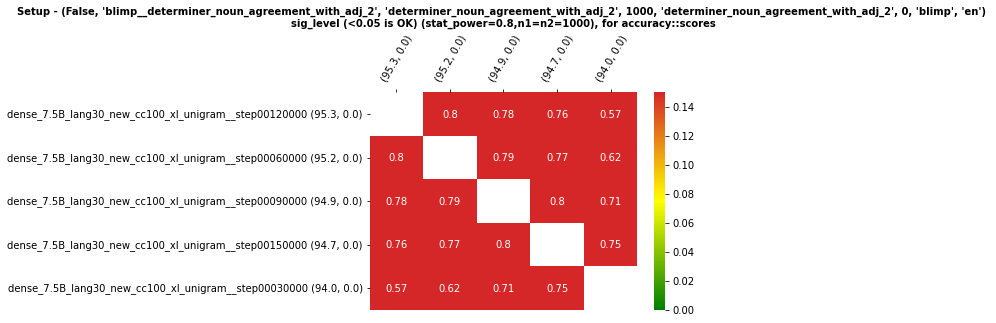

blimp__irregular_past_participle_verbs
(False, 'blimp__irregular_past_participle_verbs', 'irregular_past_participle_verbs', 1000, 'irregular_past_participle_verbs', 0, 'blimp', 'en')


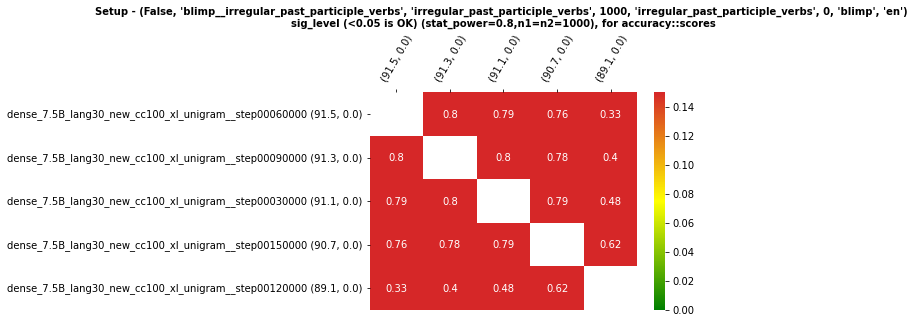

blimp__wh_vs_that_no_gap_long_distance
(False, 'blimp__wh_vs_that_no_gap_long_distance', 'wh_vs_that_no_gap_long_distance', 1000, 'wh_vs_that_no_gap_long_distance', 0, 'blimp', 'en')


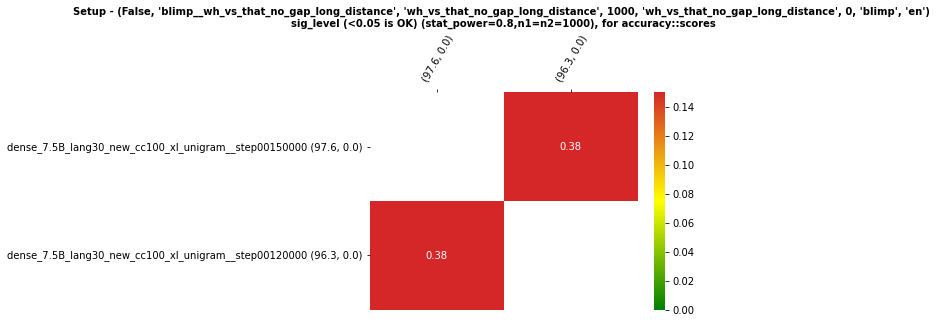

blimp__passive_2
(False, 'blimp__passive_2', 'passive_2', 1000, 'passive_2', 0, 'blimp', 'en')


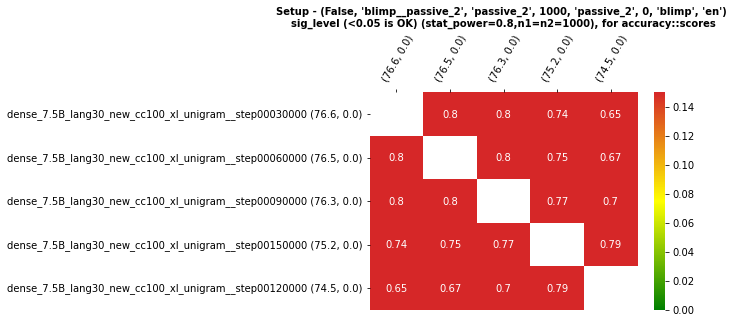

blimp__principle_a_case_2
(False, 'blimp__principle_a_case_2', 'principle_a_case_2', 1000, 'principle_a_case_2', 0, 'blimp', 'en')


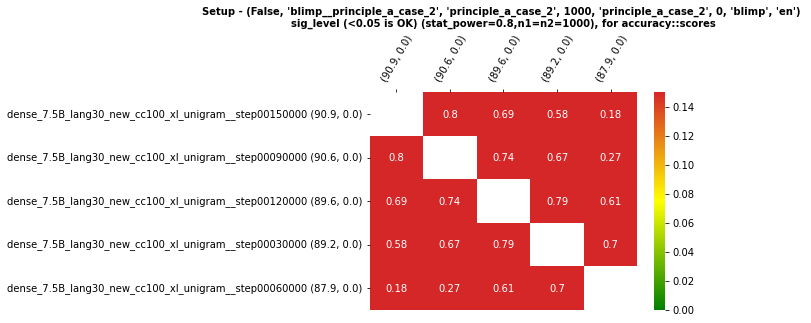

blimp__coordinate_structure_constraint_object_extraction
(False, 'blimp__coordinate_structure_constraint_object_extraction', 'coordinate_structure_constraint_object_extraction', 1000, 'coordinate_structure_constraint_object_extraction', 0, 'blimp', 'en')


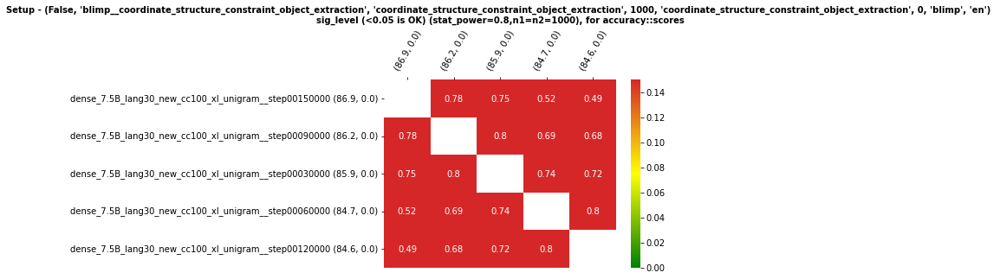

blimp__wh_questions_subject_gap
(False, 'blimp__wh_questions_subject_gap', 'wh_questions_subject_gap', 1000, 'wh_questions_subject_gap', 0, 'blimp', 'en')


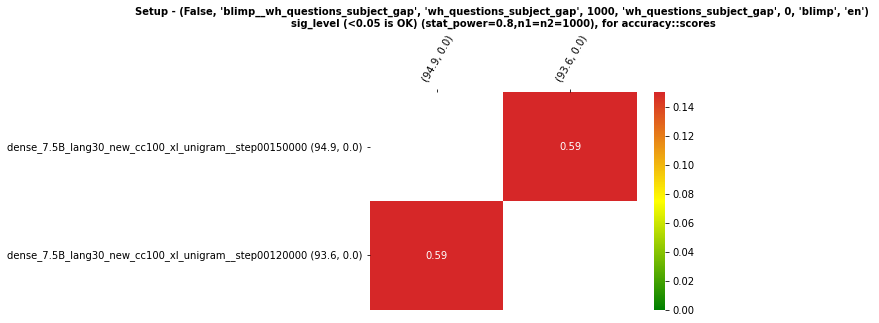

blimp__matrix_question_npi_licensor_present
(False, 'blimp__matrix_question_npi_licensor_present', 'matrix_question_npi_licensor_present', 1000, 'matrix_question_npi_licensor_present', 0, 'blimp', 'en')
p1=0.626, p2=0.626 - Cannot detect an effect-size of 0. Try changing your effect-size.


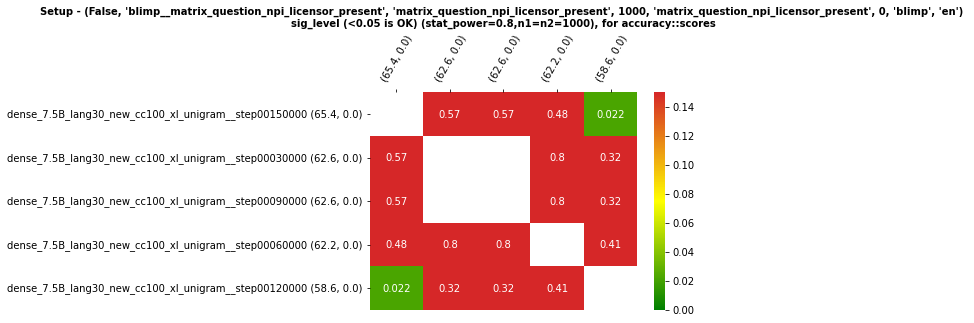

blimp__irregular_plural_subject_verb_agreement_1
(False, 'blimp__irregular_plural_subject_verb_agreement_1', 'irregular_plural_subject_verb_agreement_1', 1000, 'irregular_plural_subject_verb_agreement_1', 0, 'blimp', 'en')


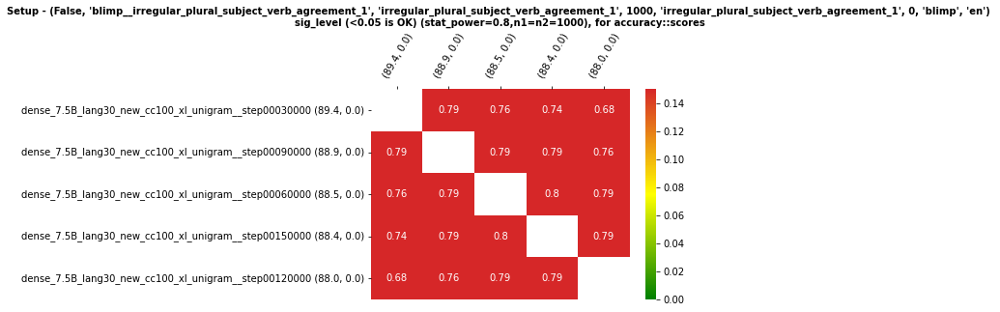

blimp__wh_questions_object_gap
(False, 'blimp__wh_questions_object_gap', 'wh_questions_object_gap', 1000, 'wh_questions_object_gap', 0, 'blimp', 'en')


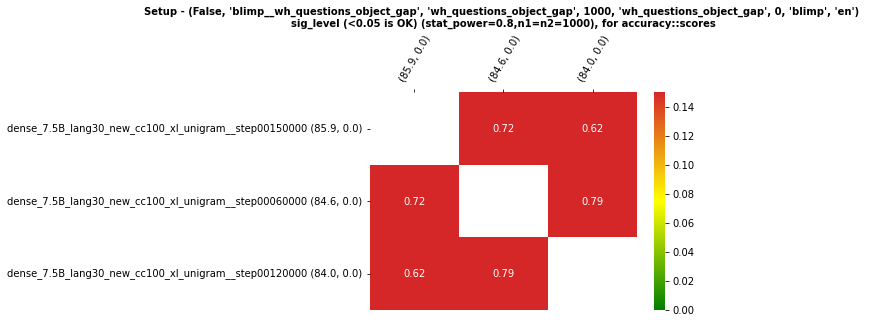

blimp__superlative_quantifiers_2
(False, 'blimp__superlative_quantifiers_2', 'superlative_quantifiers_2', 1000, 'superlative_quantifiers_2', 0, 'blimp', 'en')


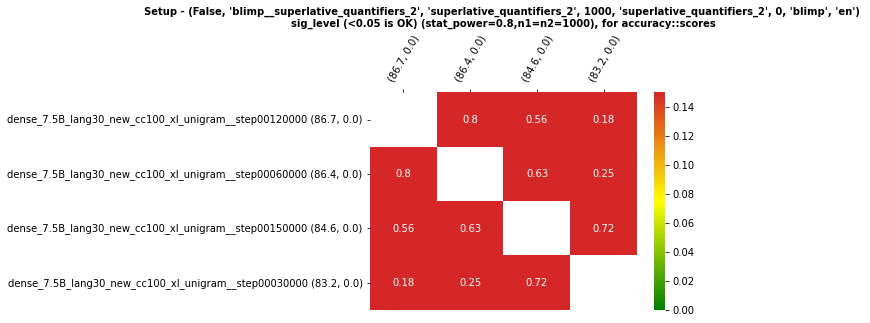

blimp__wh_vs_that_with_gap
(False, 'blimp__wh_vs_that_with_gap', 'wh_vs_that_with_gap', 1000, 'wh_vs_that_with_gap', 0, 'blimp', 'en')


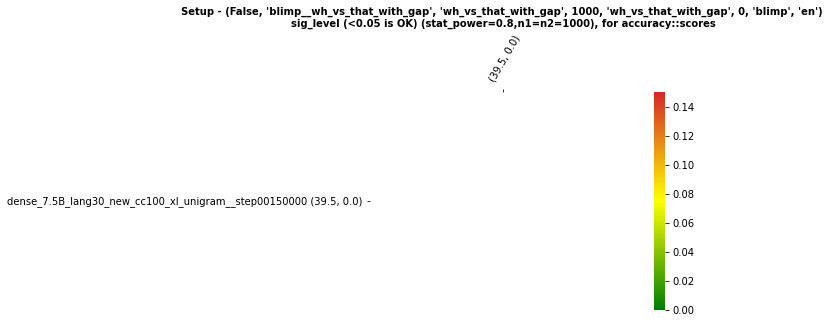

blimp__principle_a_reconstruction
(False, 'blimp__principle_a_reconstruction', 'principle_a_reconstruction', 1000, 'principle_a_reconstruction', 0, 'blimp', 'en')


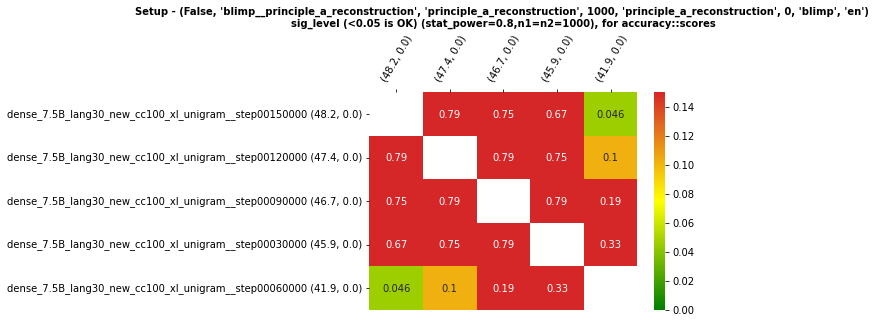

pawsx
(False, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_generativenli__en', 'de')


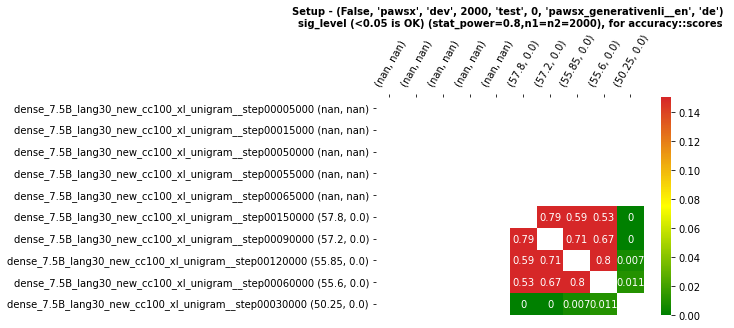

(False, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_generativenli__en', 'en')


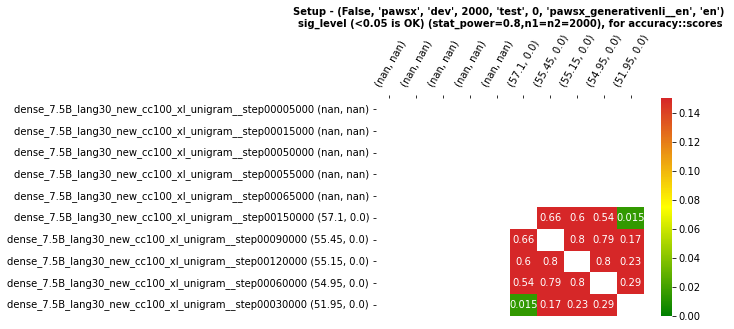

(False, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_generativenli__en', 'es')


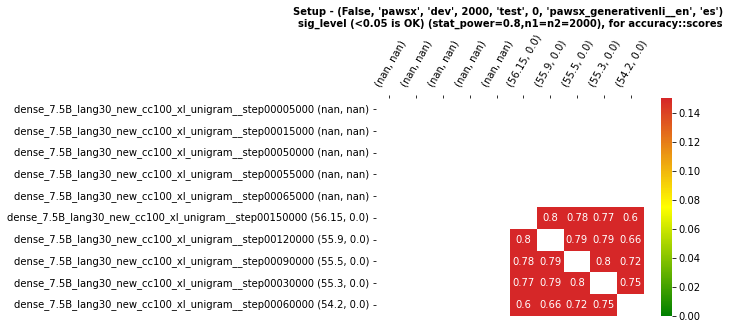

(False, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_generativenli__en', 'fr')


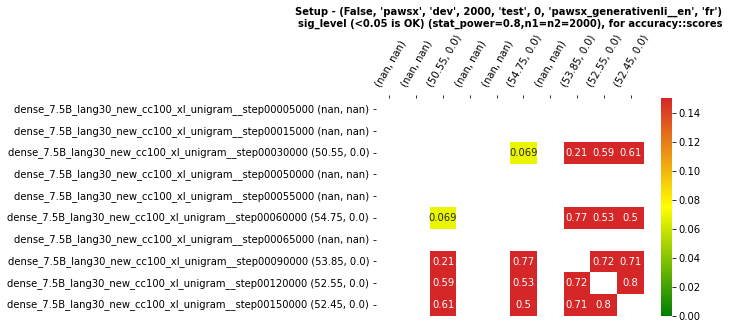

(False, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_generativenli__en', 'ja')


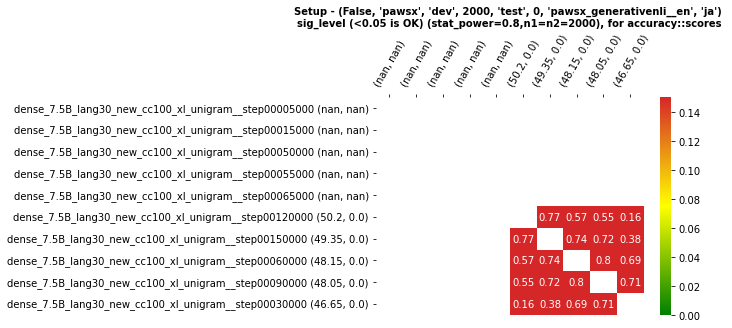

(False, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_generativenli__en', 'ko')


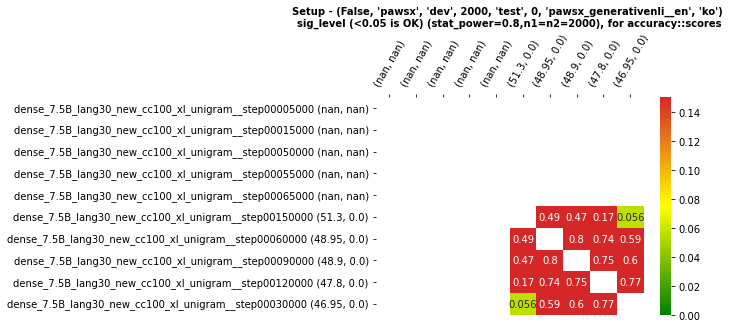

(False, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_generativenli__en', 'zh')


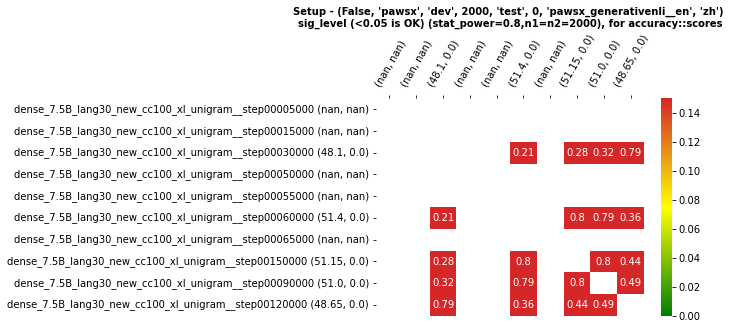

(True, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_conditional_mt', 'de')
p1=0.4175, p2=0.4175 - Cannot detect an effect-size of 0. Try changing your effect-size.


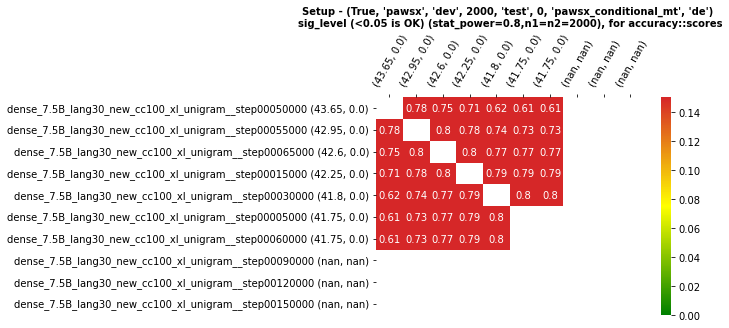

(True, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_conditional_mt', 'en')
p1=0.4315, p2=0.4315 - Cannot detect an effect-size of 0. Try changing your effect-size.
p1=0.4315, p2=0.4315 - Cannot detect an effect-size of 0. Try changing your effect-size.
p1=0.4315, p2=0.4315 - Cannot detect an effect-size of 0. Try changing your effect-size.


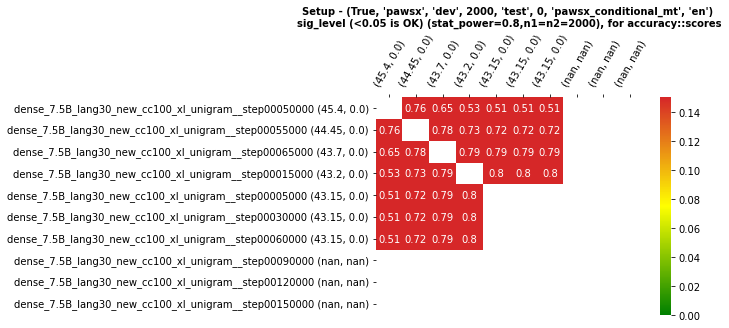

(True, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_conditional_mt', 'es')
p1=0.429, p2=0.429 - Cannot detect an effect-size of 0. Try changing your effect-size.


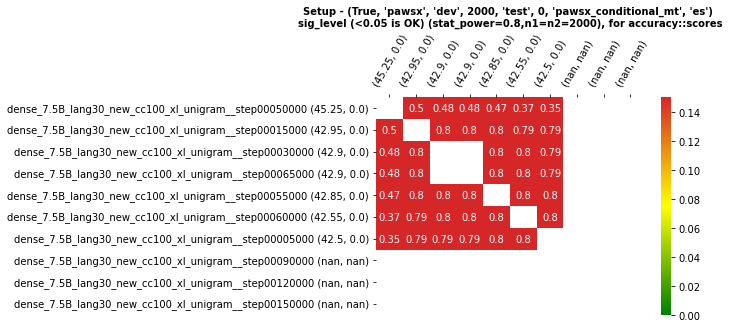

(True, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_conditional_mt', 'fr')
p1=0.4305, p2=0.4305 - Cannot detect an effect-size of 0. Try changing your effect-size.
p1=0.4305, p2=0.4305 - Cannot detect an effect-size of 0. Try changing your effect-size.
p1=0.4305, p2=0.4305 - Cannot detect an effect-size of 0. Try changing your effect-size.


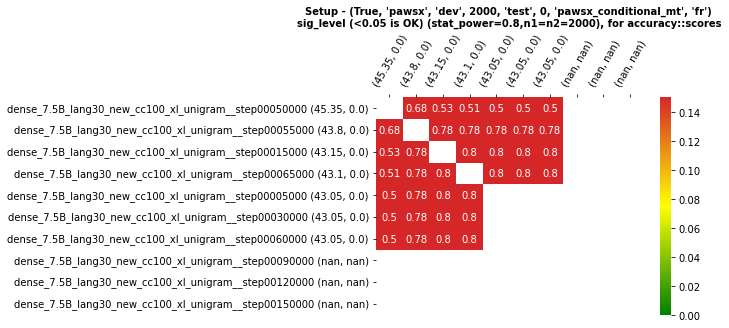

(True, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_conditional_mt', 'ja')


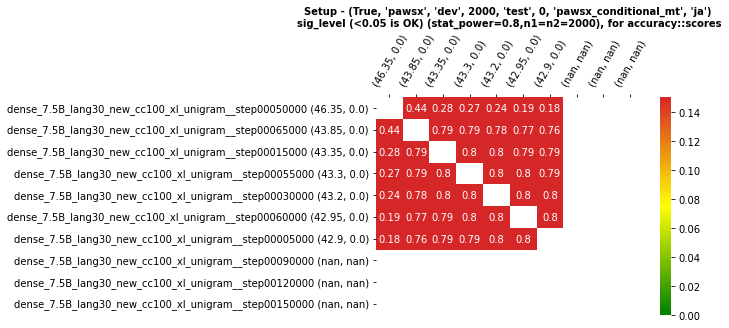

(True, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_conditional_mt', 'ko')
p1=0.4215, p2=0.4215 - Cannot detect an effect-size of 0. Try changing your effect-size.


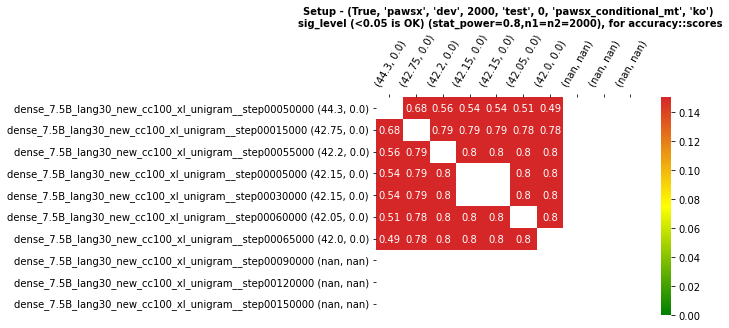

(True, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_conditional_mt', 'zh')
p1=0.42700000000000005, p2=0.42700000000000005 - Cannot detect an effect-size of 0. Try changing your effect-size.


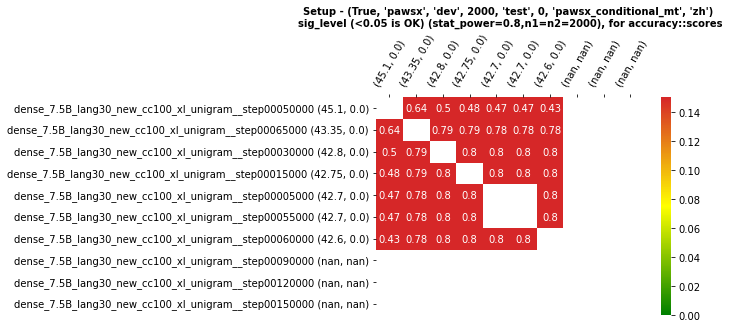

(True, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_generativenli_ht', 'de')


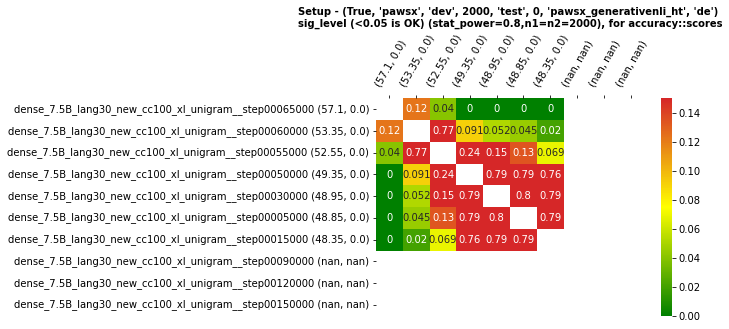

(True, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_generativenli_ht', 'en')
p1=0.555, p2=0.555 - Cannot detect an effect-size of 0. Try changing your effect-size.


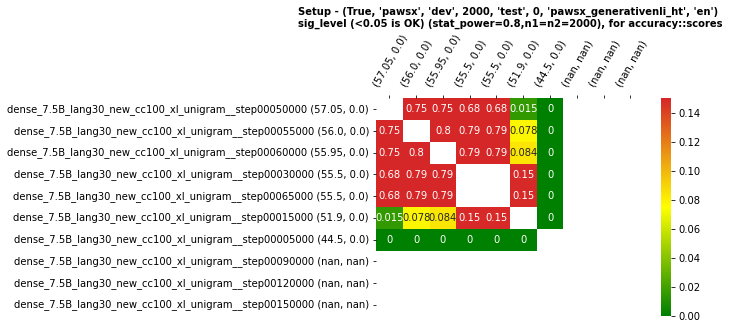

(True, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_generativenli_ht', 'es')


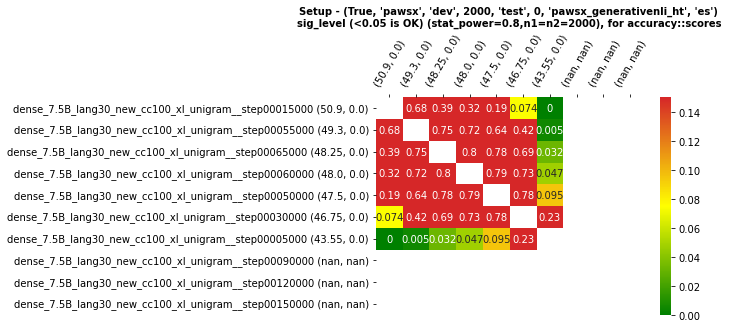

(True, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_generativenli_ht', 'fr')


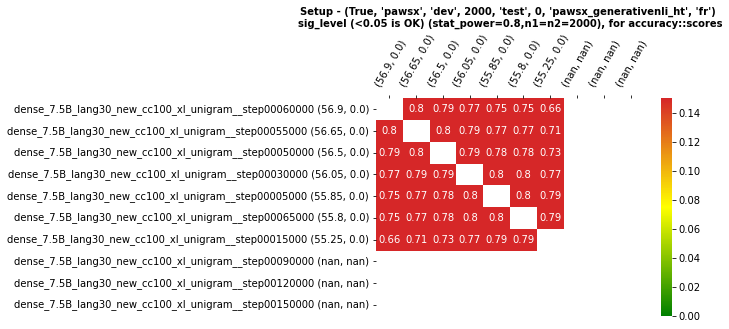

(True, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_generativenli_ht', 'ja')
p1=0.5705, p2=0.5705 - Cannot detect an effect-size of 0. Try changing your effect-size.


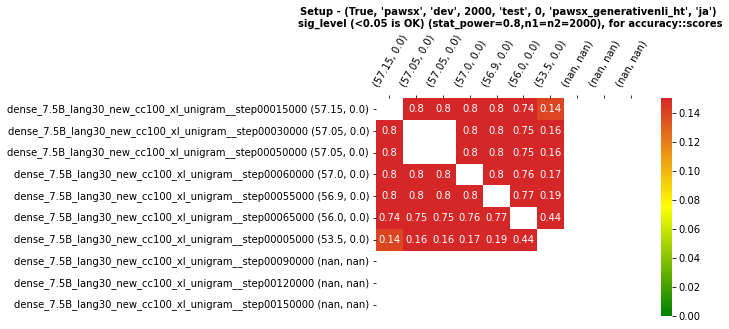

(True, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_generativenli_ht', 'ko')
p1=0.425, p2=0.575 - f(a) and f(b) must have different signs
p1=0.425, p2=0.574 - f(a) and f(b) must have different signs
p1=0.425, p2=0.563 - f(a) and f(b) must have different signs
p1=0.425, p2=0.557 - f(a) and f(b) must have different signs
p1=0.425, p2=0.5539999999999999 - f(a) and f(b) must have different signs


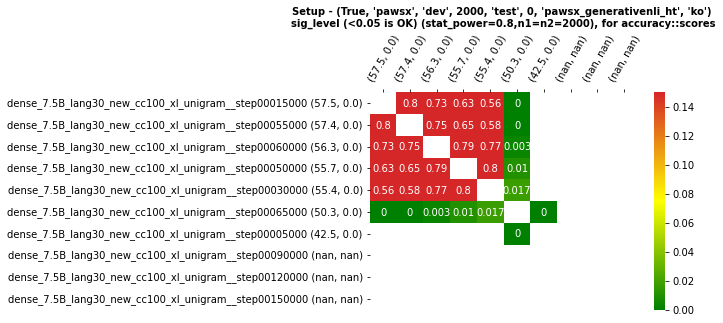

(True, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_generativenli_ht', 'zh')


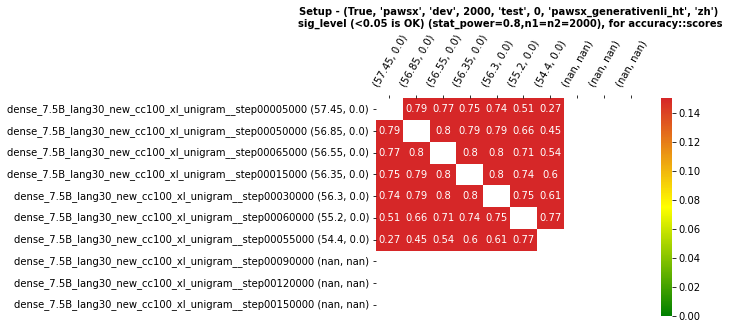

(True, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_generativenli_mt', 'de')
p1=0.586, p2=0.586 - Cannot detect an effect-size of 0. Try changing your effect-size.


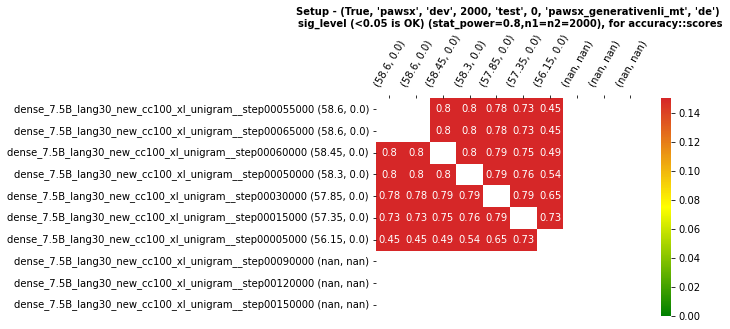

(True, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_generativenli_mt', 'en')
p1=0.555, p2=0.555 - Cannot detect an effect-size of 0. Try changing your effect-size.


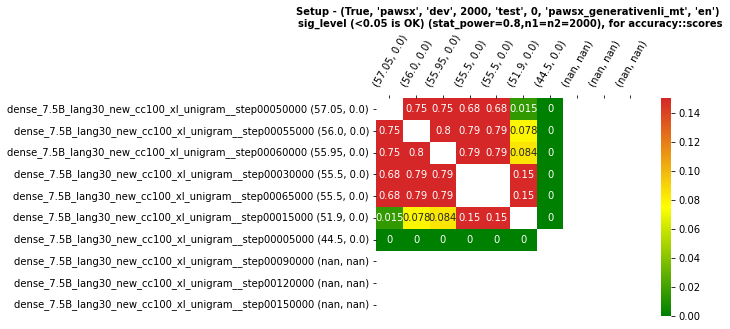

(True, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_generativenli_mt', 'es')


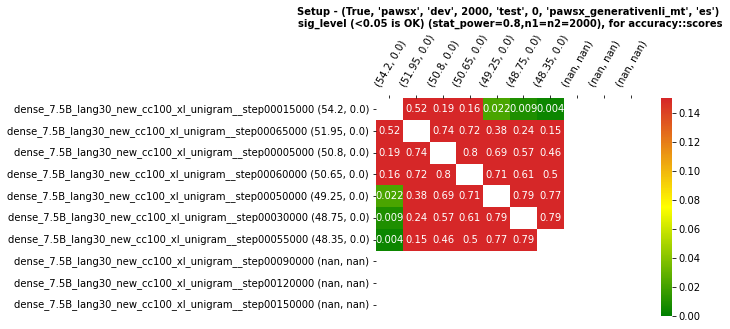

(True, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_generativenli_mt', 'fr')


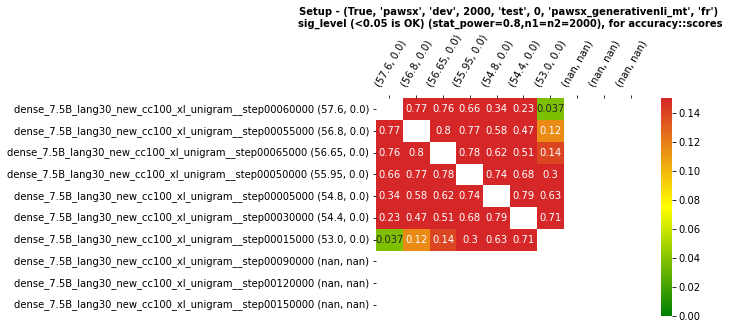

(True, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_generativenli_mt', 'ja')
p1=0.5705, p2=0.5705 - Cannot detect an effect-size of 0. Try changing your effect-size.


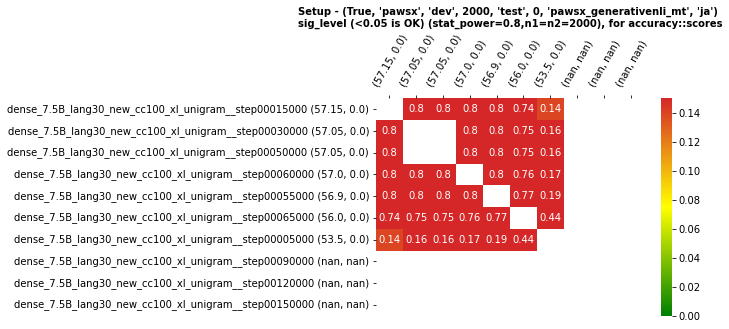

(True, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_generativenli_mt', 'ko')
p1=0.425, p2=0.575 - f(a) and f(b) must have different signs
p1=0.425, p2=0.574 - f(a) and f(b) must have different signs
p1=0.425, p2=0.563 - f(a) and f(b) must have different signs
p1=0.425, p2=0.557 - f(a) and f(b) must have different signs
p1=0.425, p2=0.5539999999999999 - f(a) and f(b) must have different signs


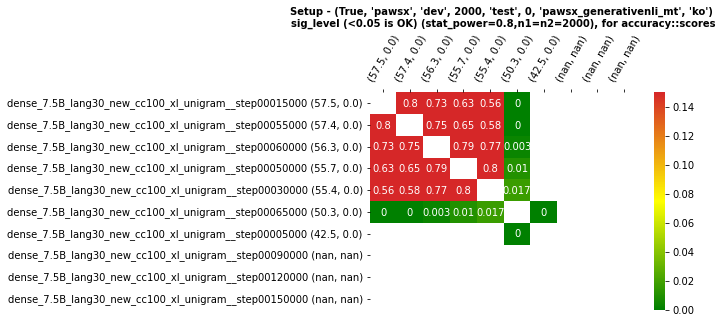

(True, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_generativenli_mt', 'zh')


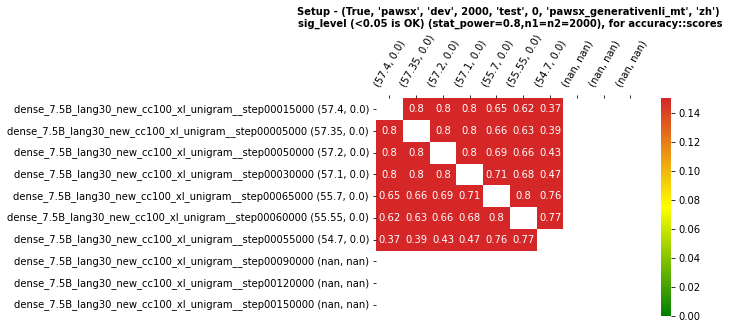

(True, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_mt', 'de')
p1=0.42100000000000004, p2=0.56 - f(a) and f(b) must have different signs


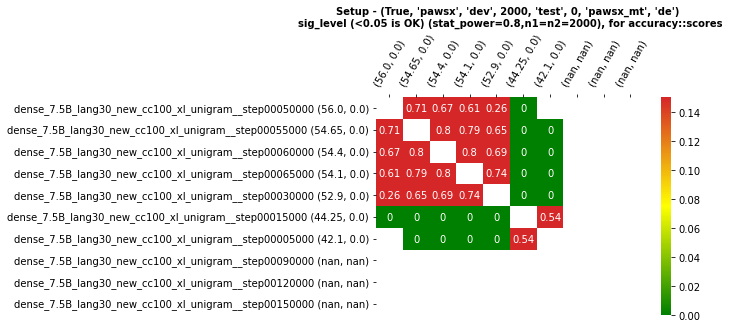

(True, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_mt', 'en')


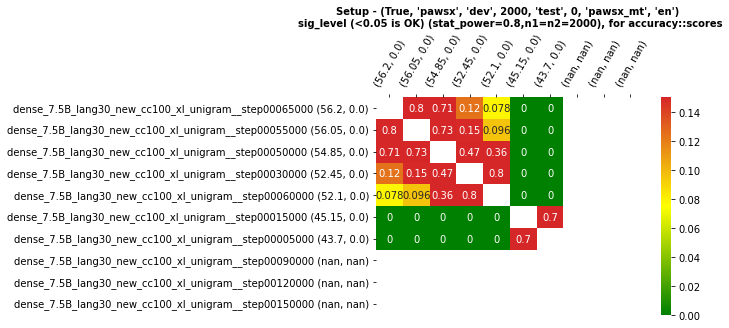

(True, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_mt', 'es')


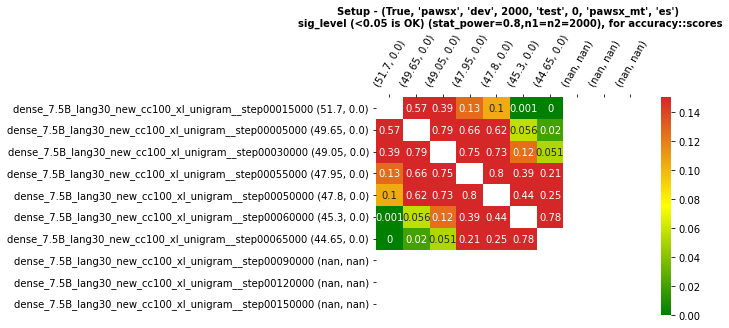

(True, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_mt', 'fr')


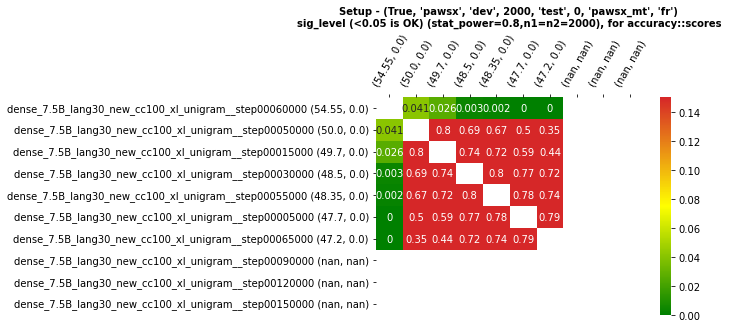

(True, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_mt', 'ja')


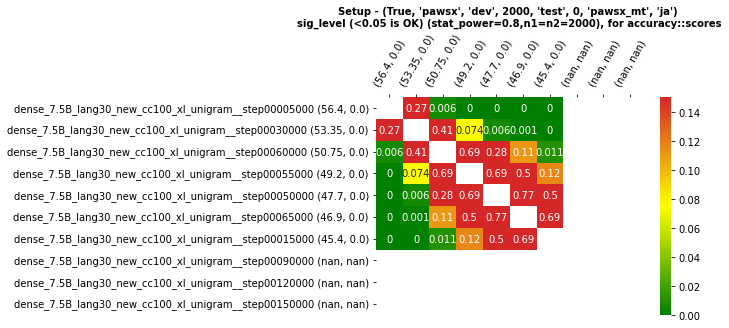

(True, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_mt', 'ko')


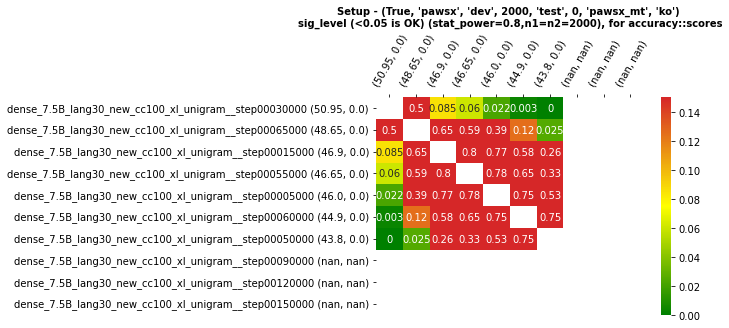

(True, 'pawsx', 'dev', 2000, 'test', 0, 'pawsx_mt', 'zh')
p1=0.4675, p2=0.4675 - Cannot detect an effect-size of 0. Try changing your effect-size.


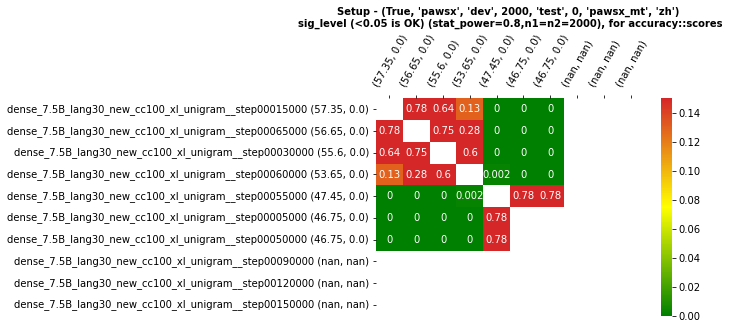

blimp__intransitive
(False, 'blimp__intransitive', 'intransitive', 1000, 'intransitive', 0, 'blimp', 'en')


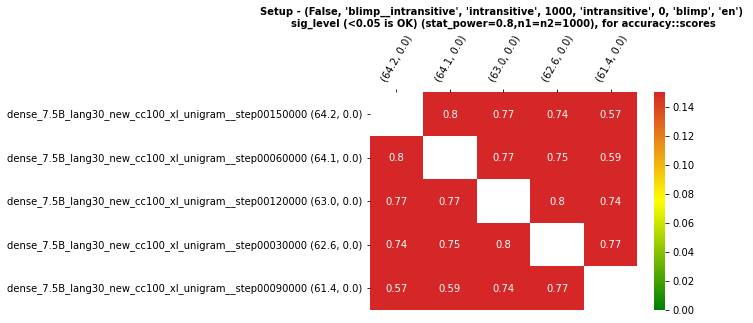

blimp__wh_vs_that_with_gap_long_distance
(False, 'blimp__wh_vs_that_with_gap_long_distance', 'wh_vs_that_with_gap_long_distance', 1000, 'wh_vs_that_with_gap_long_distance', 0, 'blimp', 'en')


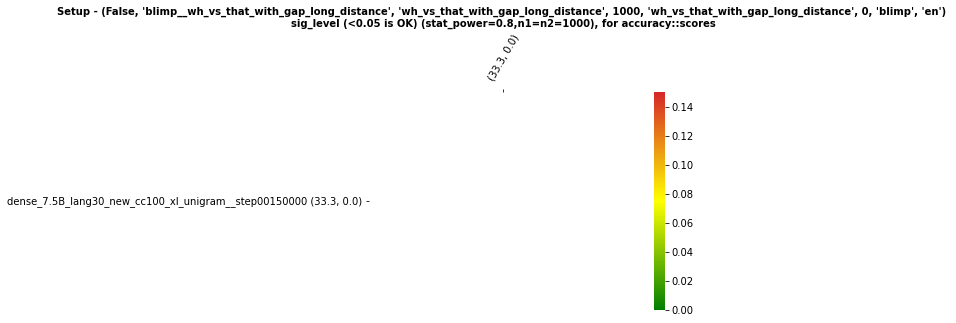

blimp__expletive_it_object_raising
(False, 'blimp__expletive_it_object_raising', 'expletive_it_object_raising', 1000, 'expletive_it_object_raising', 0, 'blimp', 'en')
p1=0.7290000000000001, p2=0.7290000000000001 - Cannot detect an effect-size of 0. Try changing your effect-size.


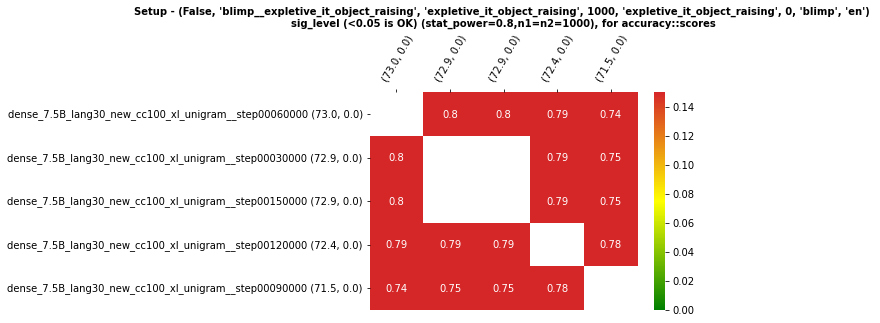

blimp__npi_present_2
(False, 'blimp__npi_present_2', 'npi_present_2', 1000, 'npi_present_2', 0, 'blimp', 'en')


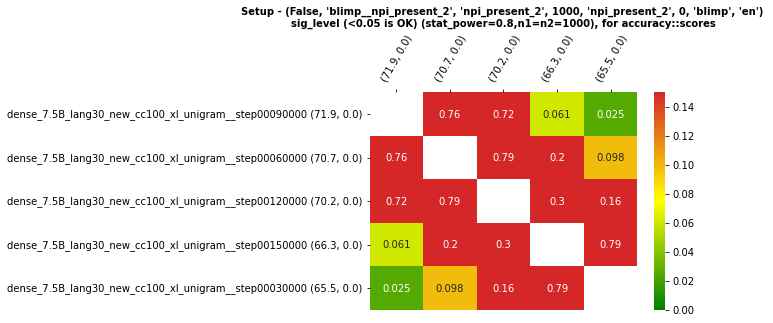

blimp__adjunct_island
(False, 'blimp__adjunct_island', 'adjunct_island', 1000, 'adjunct_island', 0, 'blimp', 'en')


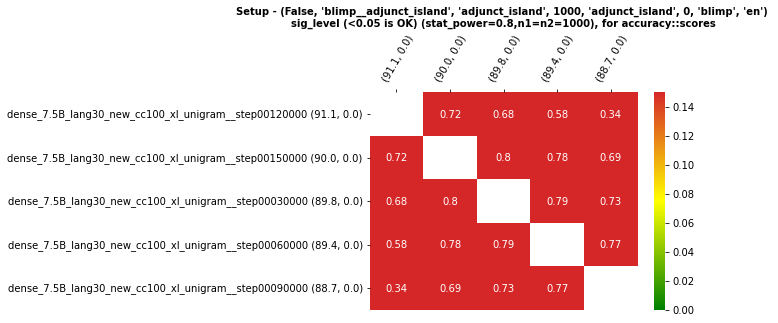

blimp__principle_a_case_1
(False, 'blimp__principle_a_case_1', 'principle_a_case_1', 1000, 'principle_a_case_1', 0, 'blimp', 'en')
p1=1.0, p2=1.0 - p1 should be between (0, 1)
p1=1.0, p2=1.0 - p1 should be between (0, 1)
p1=1.0, p2=1.0 - p1 should be between (0, 1)
p1=1.0, p2=1.0 - p1 should be between (0, 1)
p1=1.0, p2=1.0 - p1 should be between (0, 1)
p1=1.0, p2=1.0 - p1 should be between (0, 1)
p1=0.998, p2=1.0 - p2 should be between (0, 1)
p1=0.998, p2=1.0 - p2 should be between (0, 1)
p1=0.998, p2=1.0 - p2 should be between (0, 1)
p1=0.998, p2=1.0 - p2 should be between (0, 1)


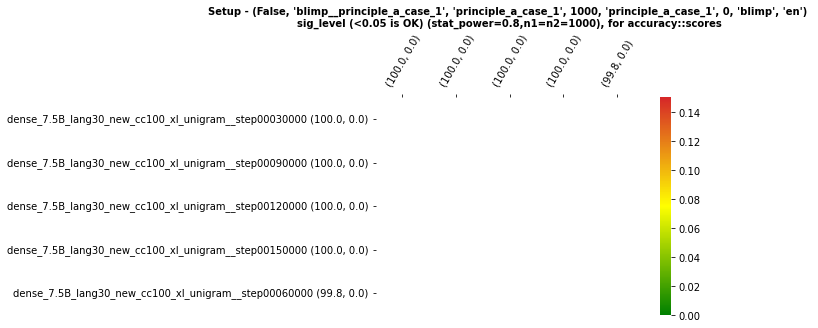

blimp__wh_island
(False, 'blimp__wh_island', 'wh_island', 1000, 'wh_island', 0, 'blimp', 'en')


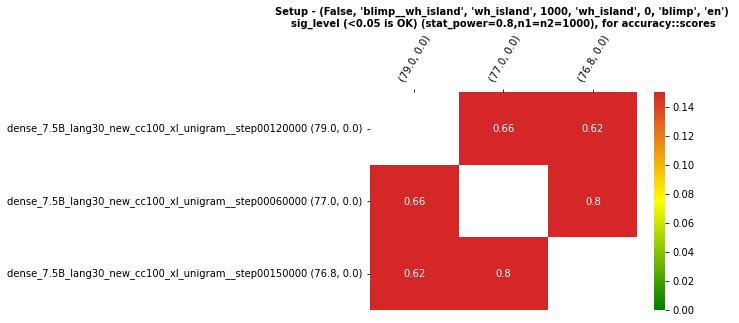

blimp__irregular_plural_subject_verb_agreement_2
(False, 'blimp__irregular_plural_subject_verb_agreement_2', 'irregular_plural_subject_verb_agreement_2', 1000, 'irregular_plural_subject_verb_agreement_2', 0, 'blimp', 'en')
p1=0.861, p2=0.861 - Cannot detect an effect-size of 0. Try changing your effect-size.


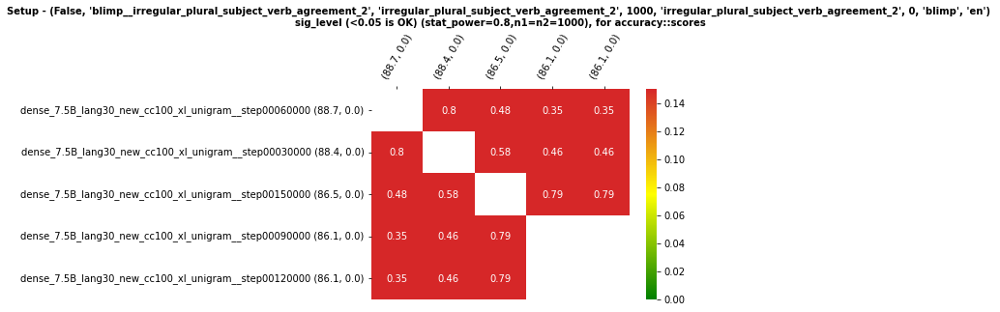

blimp__principle_a_domain_1
(False, 'blimp__principle_a_domain_1', 'principle_a_domain_1', 1000, 'principle_a_domain_1', 0, 'blimp', 'en')
p1=0.991, p2=0.991 - Cannot detect an effect-size of 0. Try changing your effect-size.


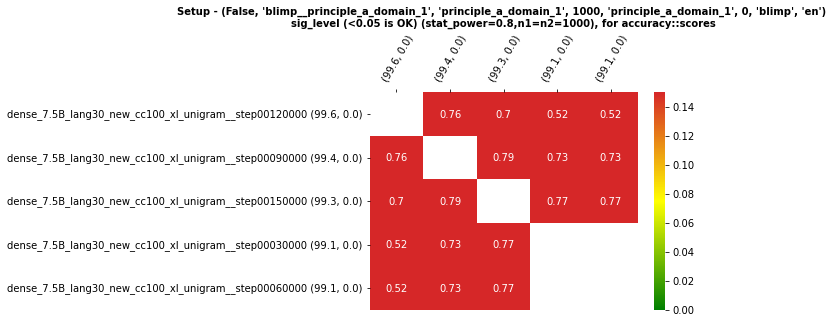

winogrande
(False, 'winogrande', 'dev', 1267, 'train_xl', 0, 'winogrande', 'en')
p1=0.5540647198105761, p2=0.5540647198105761 - Cannot detect an effect-size of 0. Try changing your effect-size.


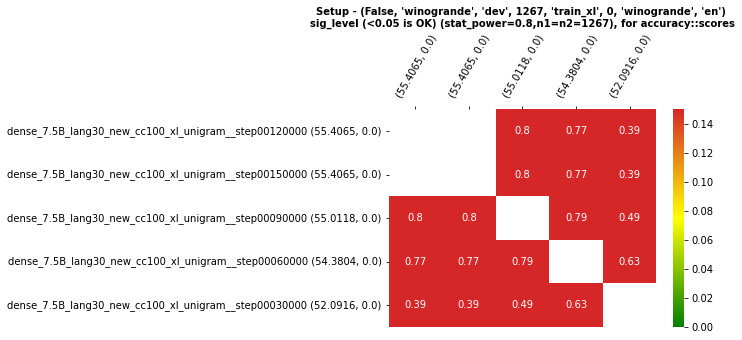

blimp__complex_np_island
(False, 'blimp__complex_np_island', 'complex_np_island', 1000, 'complex_np_island', 0, 'blimp', 'en')


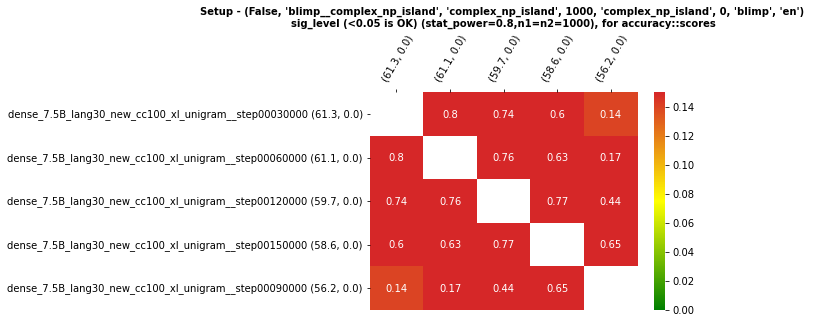

blimp__only_npi_licensor_present
(False, 'blimp__only_npi_licensor_present', 'only_npi_licensor_present', 1000, 'only_npi_licensor_present', 0, 'blimp', 'en')


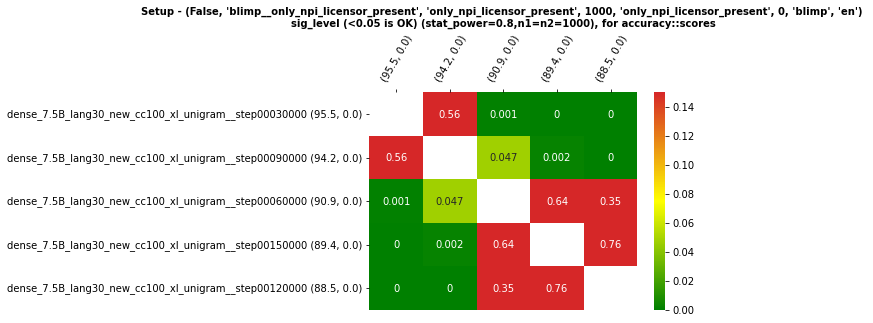

blimp__npi_present_1
(False, 'blimp__npi_present_1', 'npi_present_1', 1000, 'npi_present_1', 0, 'blimp', 'en')


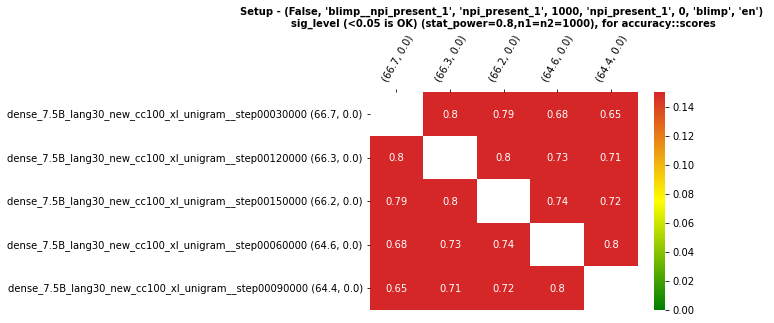

arceasy
(False, 'arceasy', 'dev', 570, 'train', 0, 'arc_old', 'en')


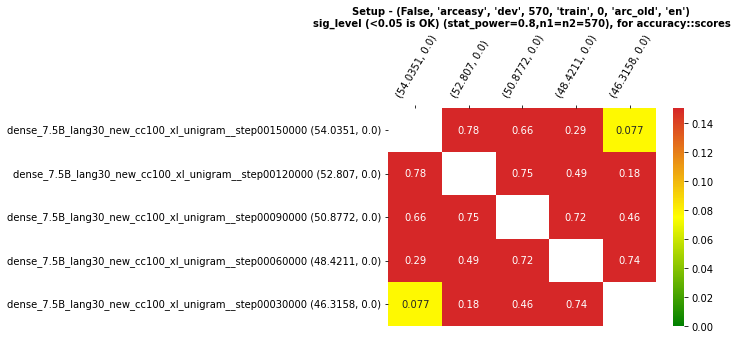

blimp__existential_there_subject_raising
(False, 'blimp__existential_there_subject_raising', 'existential_there_subject_raising', 1000, 'existential_there_subject_raising', 0, 'blimp', 'en')
p1=0.873, p2=0.873 - Cannot detect an effect-size of 0. Try changing your effect-size.


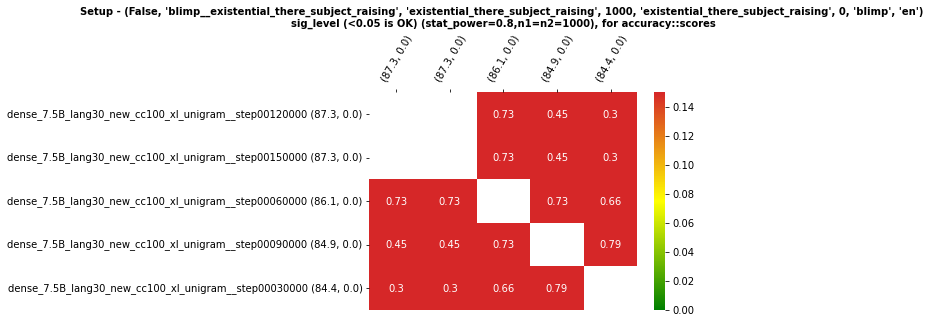

blimp__left_branch_island_echo_question
(False, 'blimp__left_branch_island_echo_question', 'left_branch_island_echo_question', 1000, 'left_branch_island_echo_question', 0, 'blimp', 'en')


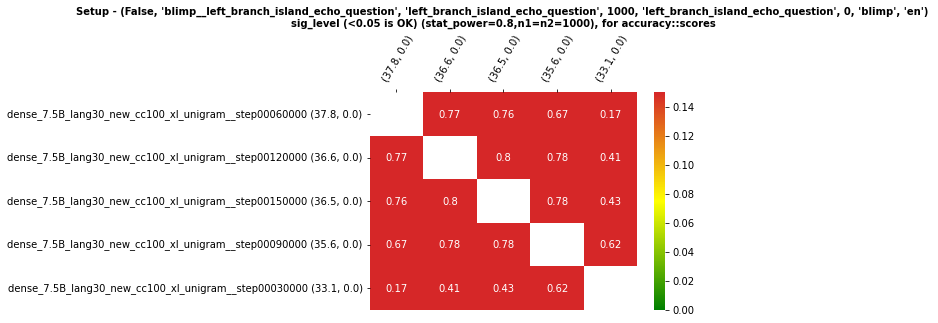

blimp__animate_subject_passive
(False, 'blimp__animate_subject_passive', 'animate_subject_passive', 1000, 'animate_subject_passive', 0, 'blimp', 'en')


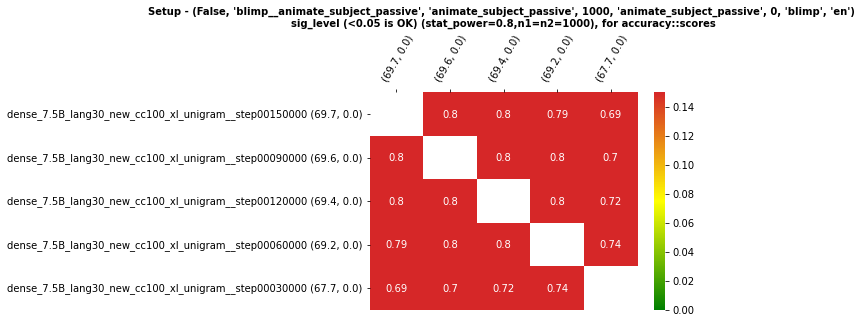

hellaswag
(False, 'hellaswag', 'val', 10042, 'train', 0, 'hellaswag', 'en')


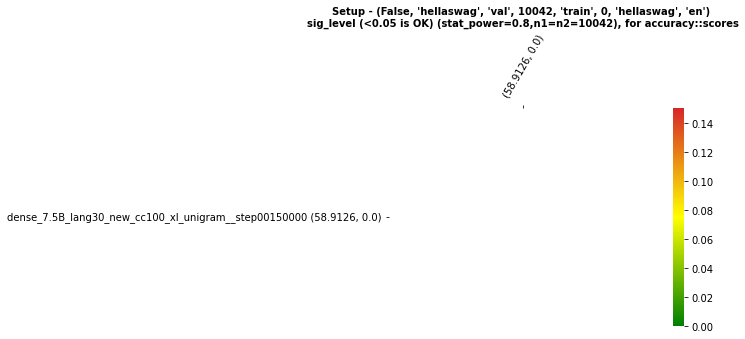

xcopa
(False, 'xcopa', 'val', 100, 'test', 0, 'xcopa', 'et')


TypeError: unsupported operand type(s) for /: 'list' and 'int'

In [14]:
plt.rc('font', size=10)
plt.rc('axes', titlesize=10)

cmap_green_yellow_red = LinearSegmentedColormap.from_list(
    name='test', 
    colors=['green','yellow','tab:red']
)

tasks = list(set(df["task"]))
tasks

use_mean_score = True # 

for task in tasks:
    print(task)
    df_task = df[df["task"] == task]
    #df_task = df_task[df_task["eval_examples_cnt"]]
    
    value_cols = "accuracy::scores"
    #value_cols = "accuracy_mean::scores"
    index_cols = ["calibration", "task", "eval_set", "eval_examples_cnt", "train_set", "nb_few_shot_samples", 
              "template", "language",
             ]
    cols = [ "model_name"]
    
    pt = pd.pivot_table(df_task, values=value_cols, index=index_cols,
                    columns=cols, aggfunc=lambda x: x)
    #print(pt)
    for setup_idx, row in pt.iterrows():
        warnings.filterwarnings("ignore")
        print(setup_idx) 
        eval_set_examples = setup_idx[3]
        models_cnt = len([x for x in row.iteritems()])
        significance_matrix = -np.ones((models_cnt, models_cnt))
        model_scores = [(model0, scores0 if isinstance(scores0, list) else [scores0]) for model0, scores0 in row.iteritems()]
        model_scores.sort(key=lambda x: np.mean(x[1]), reverse=True)
        model_labels_y_axis = [f"{x[0]} {(np.round(np.mean(x[1]),4), np.round(np.std(x[1]),4))}" for x in model_scores]
        model_labels_x_axis = [f" {(np.round(np.mean(x[1]),4), np.round(np.std(x[1]),4))}" for x in model_scores]
        for i0, (model0, scores0) in enumerate(model_scores):
            for i1, (model1, scores1) in enumerate(model_scores):
                if i1 >= i0:
                    continue
                    
                if not isinstance(scores0, list):
                    scores0 = [scores0]
                if not isinstance(scores1, list):
                    scores1 = [scores1]
                    
                if len(scores0) != len(scores1):
                    print(f"Different number of evals {model0}({len(scores0)}) {model1}({len(scores1)}).")
                    continue
                
                    
                overall_sig_level = (-1.0, 0.0)
                
                try:
                    score0, score0_std = np.mean(scores0), np.std(scores0)
                    score1, score1_std = np.mean(scores1), np.std(scores1)

                    if np.isnan(score0) or np.isnan(score1):
                        continue

                    if score0 > 1.0:
                        score0 = score0 / 100.00
                    if score1 > 1.0:
                        score1 = score1 / 100.00
                        
                    sig_level, suggestions = ProportionSignificanceTest().solve(
                                n1=eval_set_examples, n2=eval_set_examples, p1=score0, p2=score1, power=min_stat_power, sig_level=None
                            ) 
                    overall_sig_level = (sig_level, 0.0)
                except Exception as e:
                        print(f"p1={score0}, p2={score1} - {e}")
                significance_matrix[i0, i1] = overall_sig_level[0]
                significance_matrix[i1, i0] = overall_sig_level[0]
        #plt.imshow(1-significance_matrix, cmap=plt.cm.viridis)
        sig_matrix_mask = significance_matrix < 0
        significance_matrix = np.around(significance_matrix, 3)
        ax = sns.heatmap(significance_matrix, 
                    mask=sig_matrix_mask, 
                    xticklabels=model_labels_x_axis,
                    yticklabels=model_labels_y_axis,
                    vmin=0.00,
                    vmax=3*max_sig_level,
                    annot=True,
                    cmap=cmap_green_yellow_red)
        plt.yticks(rotation=0)
        ax.tick_params(axis='x', rotation=60)
        ax.xaxis.tick_top() # x axis on top
        ax.xaxis.set_label_position('top')
        ax.set_title(f"Setup - {setup_idx} \n"
                     + f"sig_level (<{max_sig_level} is OK) (stat_power={min_stat_power},n1=n2={eval_set_examples}), for {value_cols}", weight='bold')
        
        plt.show()
        #break # debug
    #break # debug
#pt
#print(significance_matrix)

In [ ]:
np.zeros([2,3])

In [ ]:
#df[df["run_params::train_sep"] == "\n\n"]